<a href="https://colab.research.google.com/github/tcnisaa/Pengolahan_Sinyal/blob/main/Chapter%204.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


## Install Libraries

In [ ]:
!pip install PyWavelets
!pip install scipy

## Load Dataset

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, skew


# Path ke dataset
data_paths = {
    "Normal": "/content/drive/MyDrive/Colab Notebooks/EEG_Dataset_ukbonn/z/Z",  # Eyes Open Normal
    "Interictal": "/content/drive/MyDrive/Colab Notebooks/EEG_Dataset_ukbonn/f/F",  # Epileptic (Interictal)
    "Ictal": "/content/drive/MyDrive/Colab Notebooks/EEG_Dataset_ukbonn/s/S"  # Epileptic (Ictal During Seizure)
}

# Variabel untuk menyimpan data
all_signals = []
all_labels = []
all_filenames = []

# Loop melalui setiap folder
for label, path in data_paths.items():
    record_list = sorted([f for f in os.listdir(path) if f.endswith('.txt')])

    for file in record_list:
        file_path = os.path.join(path, file)
        signal = np.loadtxt(file_path)

        # Ambil 12000 sampel pertama
        signal = signal[:12000]

        # Simpan data, label, dan nama file
        all_signals.append(signal)
        all_labels.append(label)
        all_filenames.append(file)

# Konversi ke array NumPy
dataset = np.array(all_signals)
labels = np.array(all_labels)

# Simpan dalam DataFrame untuk keperluan analisis lebih lanjut
df_data = pd.DataFrame({"Filename": all_filenames, "Label": labels, "Signal": list(dataset)})

# Cek jumlah data per kategori
print(df_data["Label"].value_counts())

# Cek ukuran dataset
print(f"Dataset shape: {dataset.shape}")


Label
Normal        100
Interictal    100
Ictal         100
Name: count, dtype: int64
Dataset shape: (300, 4097)


## Analisis Statistik Dasar

In [ ]:
from scipy.stats import kurtosis, skew

# Fungsi untuk menghitung statistik dasar
def compute_basic_statistics(signal):
    return {
        "Mean": np.mean(signal),
        "Std Dev": np.std(signal),
        "Min": np.min(signal),
        "Max": np.max(signal),
        "Median": np.median(signal),
        "Kurtosis": kurtosis(signal),
        "Skewness": skew(signal)
    }

# Hitung statistik untuk setiap file dan simpan dalam DataFrame
stats_list = [compute_basic_statistics(signal) for signal in dataset]

# Konversi ke DataFrame Pandas dengan informasi label dan nama file
df_stats = pd.DataFrame(stats_list)
df_stats["Label"] = labels
df_stats["Filename"] = all_filenames

# Menampilkan hasil statistik untuk beberapa sampel dari tiap label
for label in np.unique(labels):
    print(f"\nStatistik untuk label: {label}")
    print(df_stats[df_stats["Label"] == label].head(3))  # Ambil 3 sampel pertama


## Visualisasi Sinyal

In [ ]:
# Sampling rate dari dataset Bonn
sampling_rate = 173.61  # Hz

### Visualisasi dengan interval detik

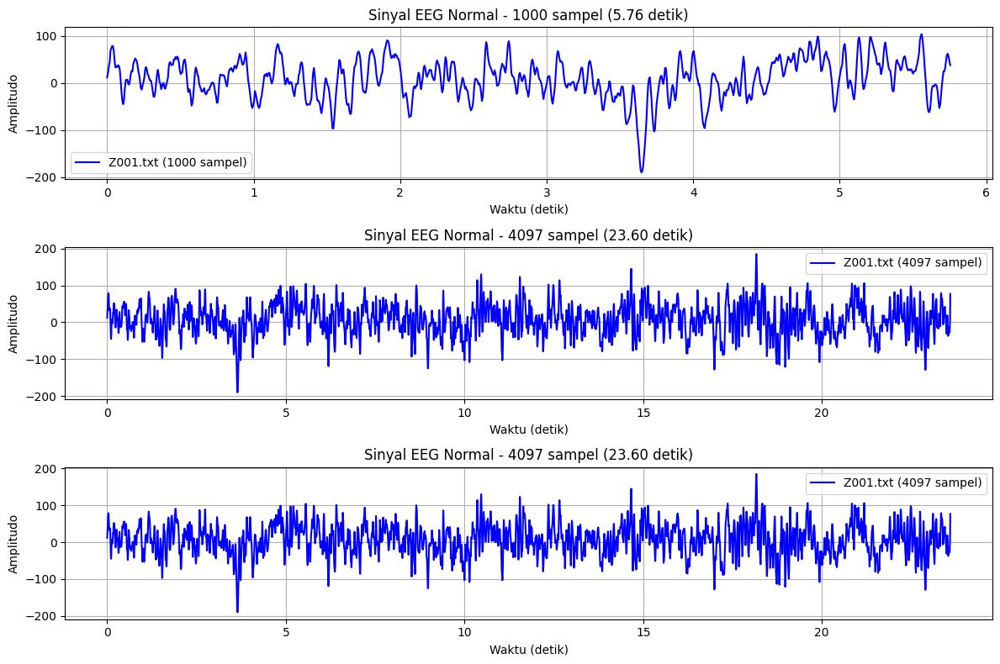

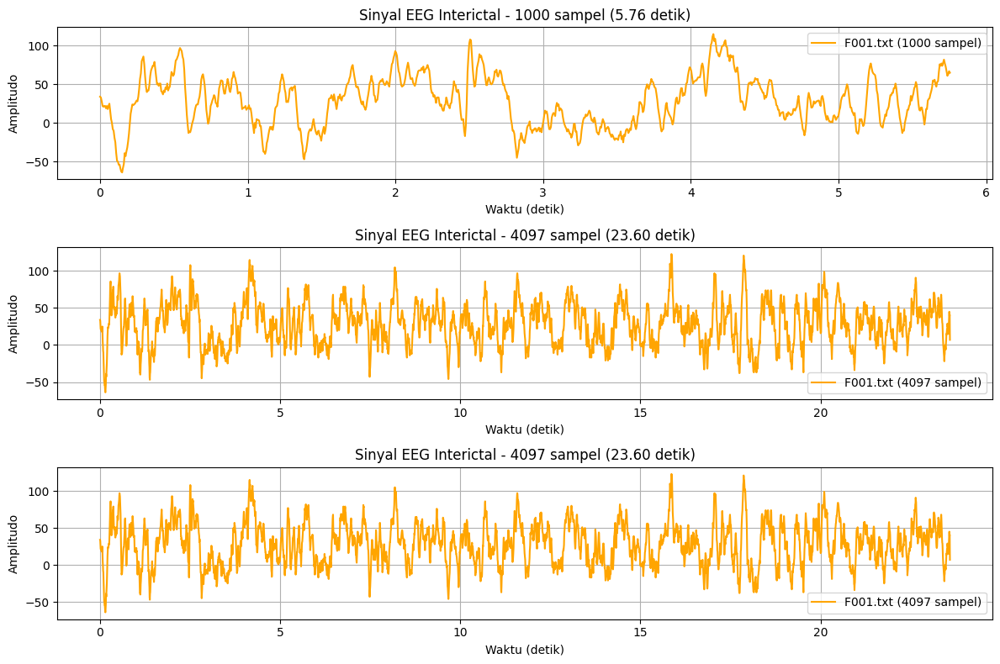

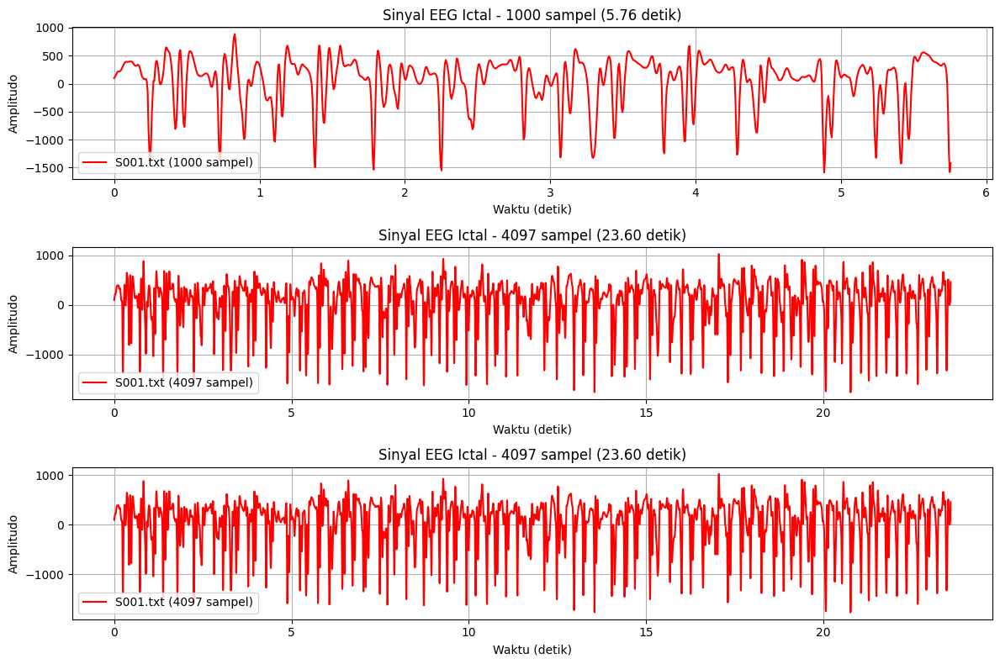

In [ ]:
# Loop melalui tiap label dengan batasan jumlah visualisasi
max_visualizations = 3  # Batasi jumlah total visualisasi
count = 0  # Hitung jumlah visualisasi yang sudah dilakukan

for label in df_data["Label"].unique():
    if count >= max_visualizations:
        break  # Hentikan jika sudah mencapai batas

    subset = df_data[df_data["Label"] == label]

    # Ambil satu sampel dari label tersebut
    signal = subset.iloc[0]["Signal"]
    filename = subset.iloc[0]["Filename"]

    plt.figure(figsize=(12, 8))

    # Plot sinyal dalam tiga skala
    for i, num_samples in enumerate(sample_sizes):
        num_samples = min(num_samples, len(signal))  # Pastikan tidak melebihi panjang sinyal
        time = np.arange(num_samples) / sampling_rate  # Konversi ke detik

        plt.subplot(3, 1, i + 1)
        plt.plot(time, signal[:num_samples], color=colors.get(label, "black"), label=f"{filename} ({num_samples} sampel)")
        plt.xlabel("Waktu (detik)")
        plt.ylabel("Amplitudo")
        plt.title(f"Sinyal EEG {label} - {num_samples} sampel ({num_samples / sampling_rate:.2f} detik)")
        plt.legend()
        plt.grid()

    plt.tight_layout()
    plt.show()

    count += 1  # Tambah hitungan visualisasi


### Visualisas dengan interval milidetik agar lebih detail

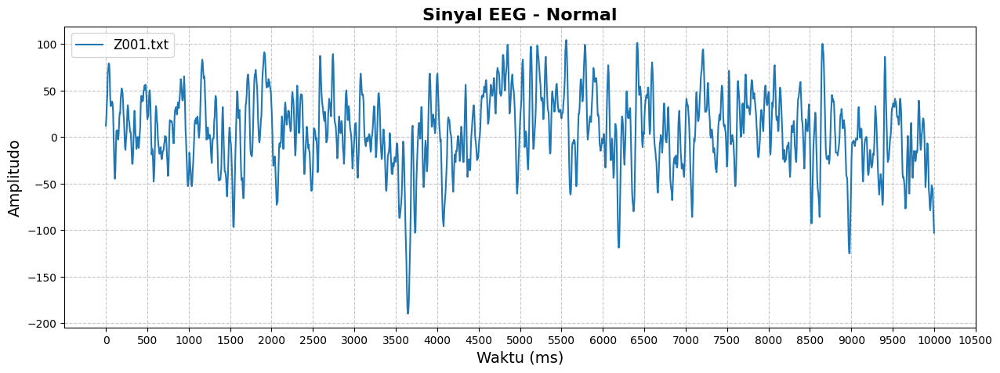

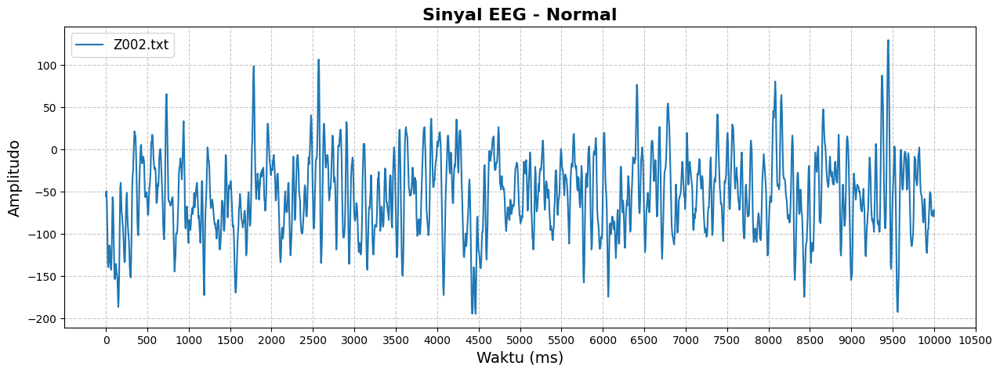

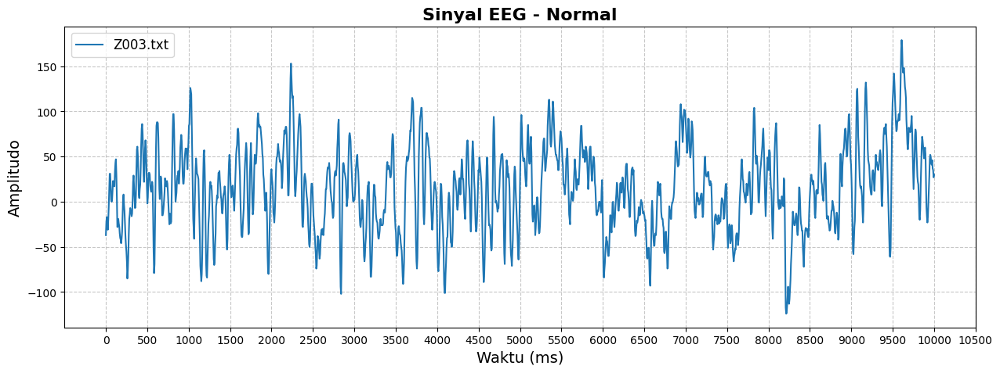

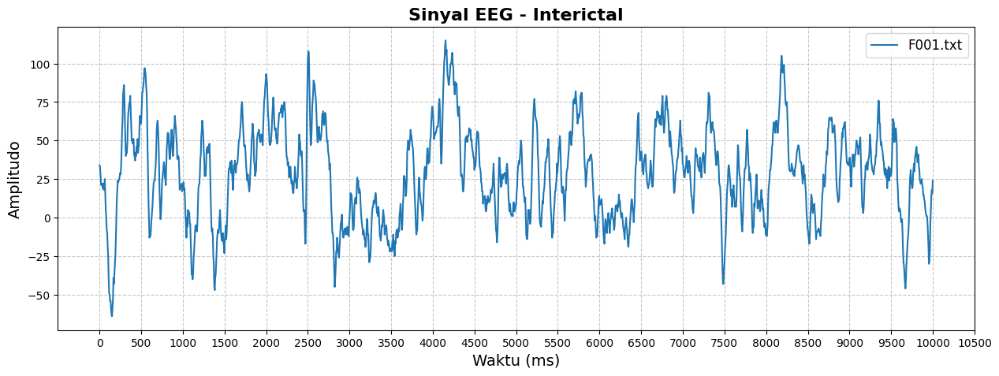

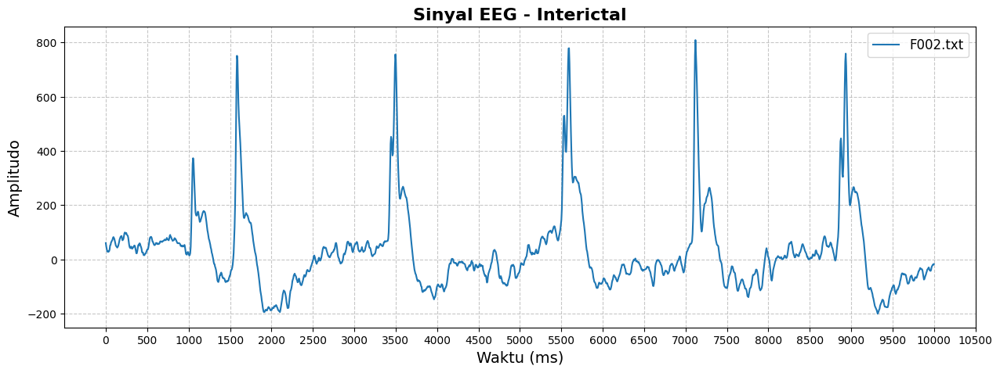

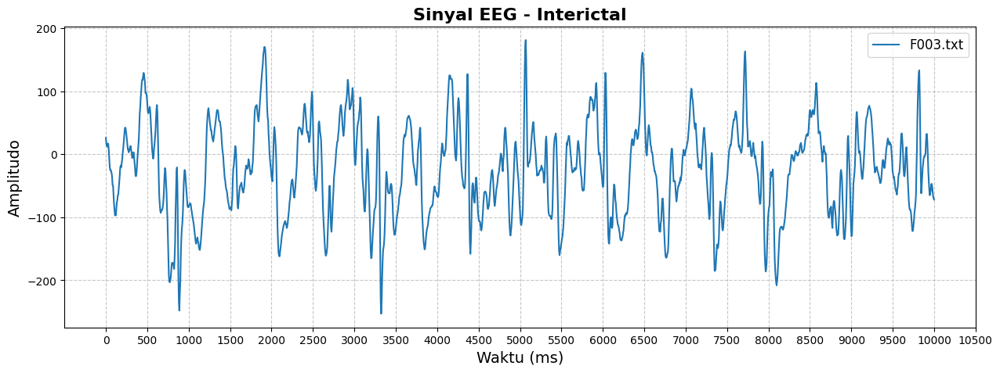

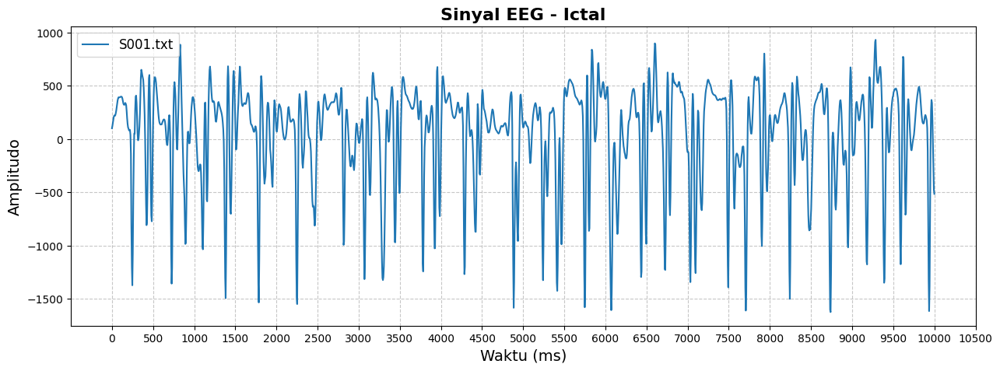

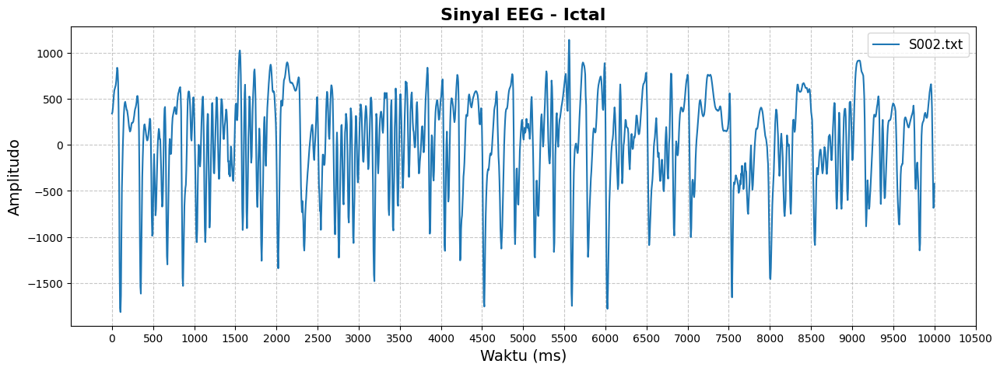

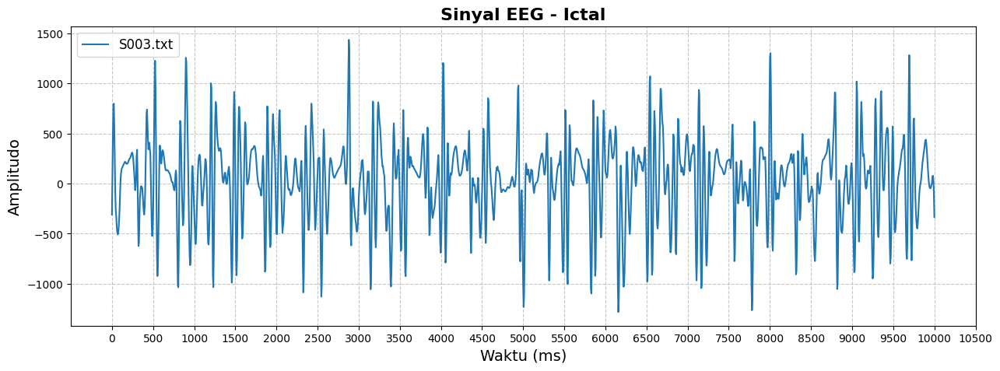

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Jumlah sampel per label yang akan divisualisasikan
samples_per_label = 3

# Loop melalui tiap label
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama

    for _, row in subset.iterrows():
        signal = row["Signal"]
        filename = row["Filename"]

        sampling_rate = 173.61  # Hz
        time_ms = (np.arange(len(signal)) / sampling_rate) * 1000  # Konversi ke ms

        # Filter hanya rentang 0 - 10000 ms
        mask = (time_ms >= 0) & (time_ms <= 10000)
        time_ms = time_ms[mask]
        signal = signal[mask]

        # Visualisasi sinyal
        plt.figure(figsize=(15, 5))
        plt.plot(time_ms, signal, label=f"{filename}", linewidth=1.5)

        plt.xlabel("Waktu (ms)", fontsize=14)
        plt.ylabel("Amplitudo", fontsize=14)
        plt.title(f"Sinyal EEG - {label}", fontsize=16, fontweight="bold")

        # Atur interval sumbu X setiap 500 ms
        plt.xticks(np.arange(0, 11000, 500))

        plt.legend(fontsize=12)
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()


## Analisis dengan Parametric Model-Based Methods

### Analisis FFT (Fast Fourier Transform)

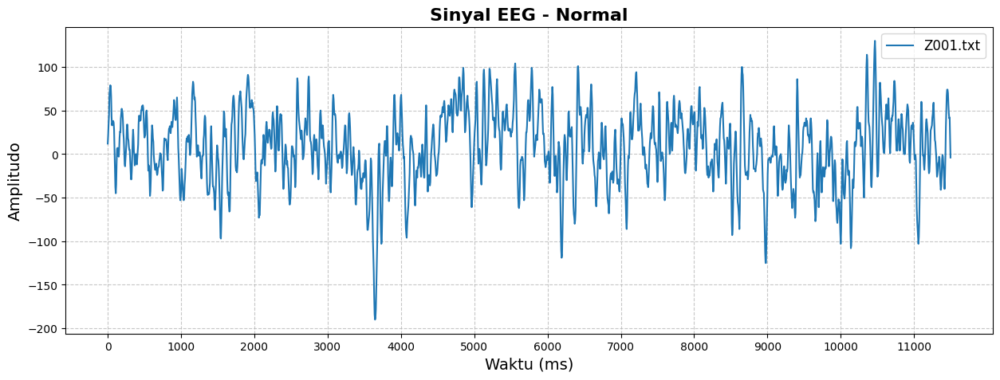

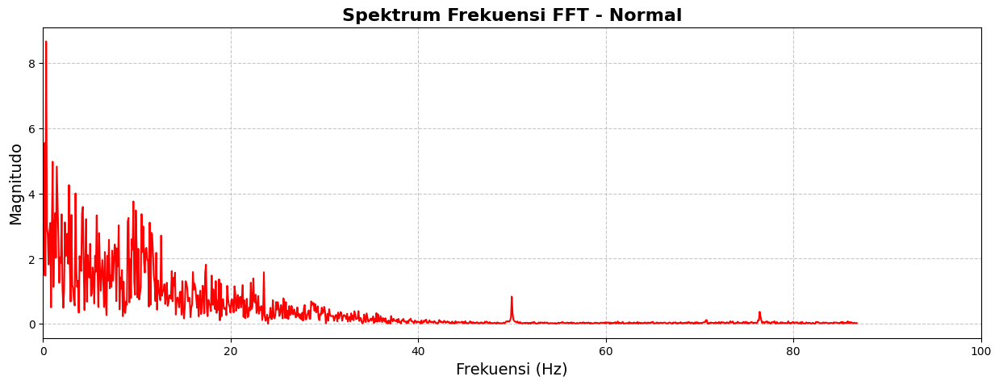

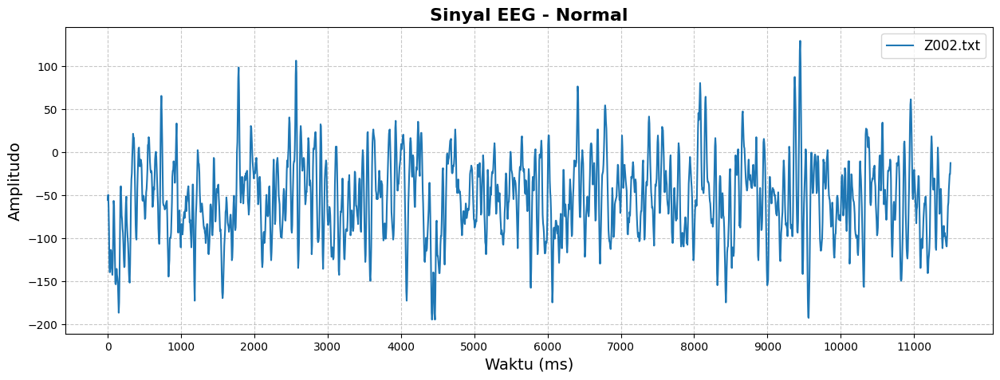

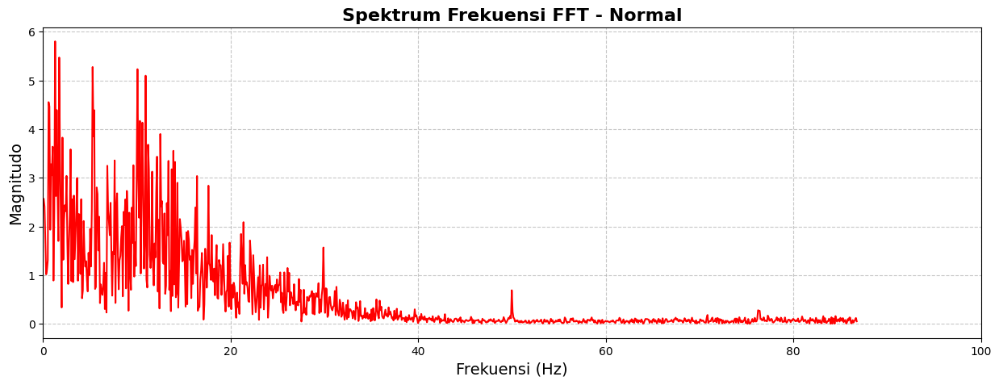

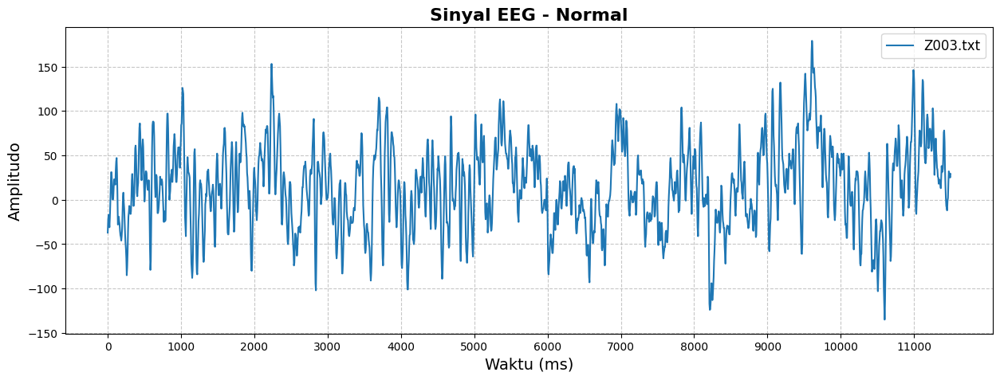

...

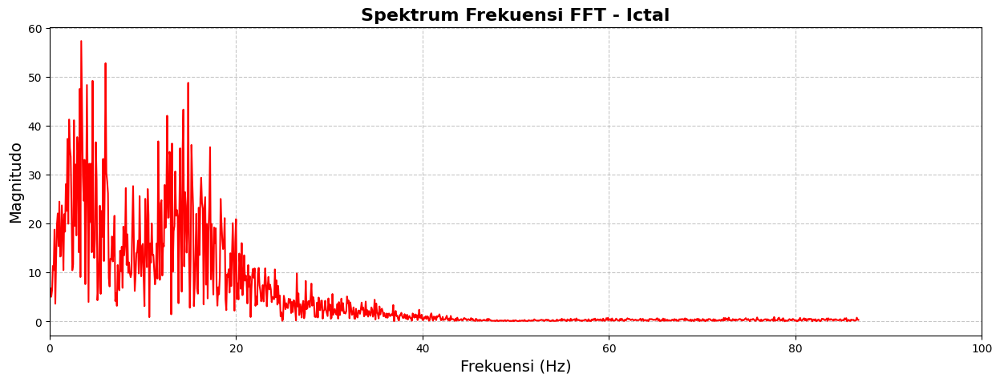

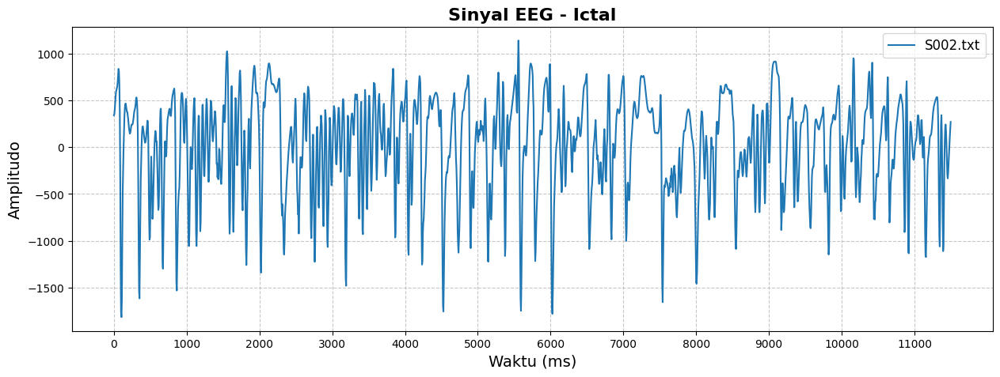

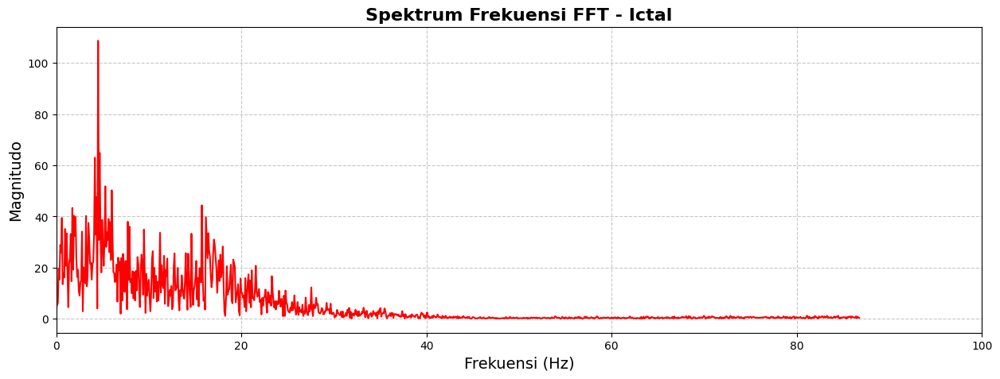

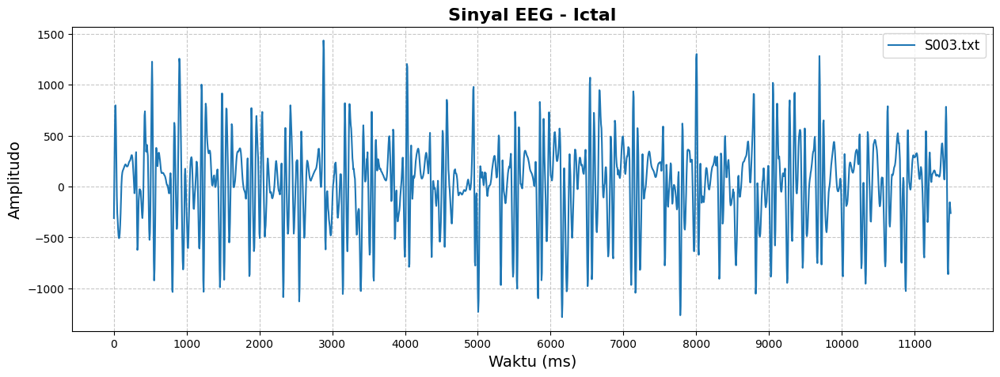

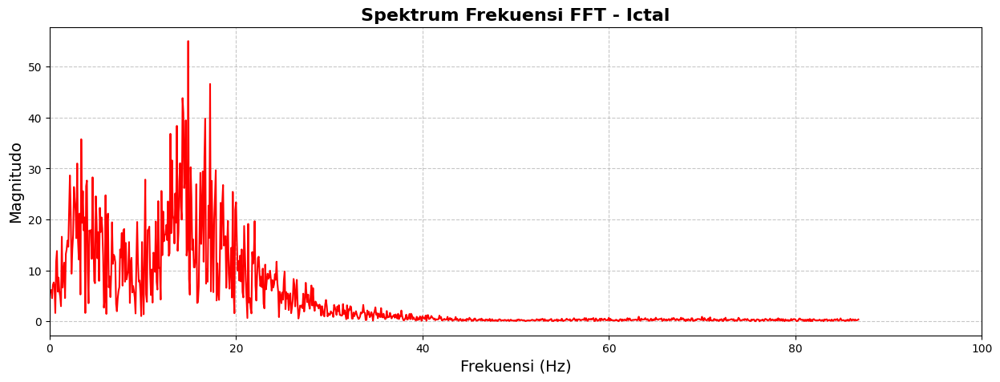

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Parameter sesuai aturan awal
Fs = 173.6  # Sampling frequency (Hz)
T = 1 / Fs  # Sampling period
segmentLength = 128  # Panjang segmen
Length = 4096  # Panjang sinyal asli
samples_per_label = 3  # Batasi 3 sampel per label

# Loop melalui tiap label
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama

    for _, row in subset.iterrows():
        signal = row["Signal"][:Length]  # Pastikan hanya ambil 4096 sampel
        filename = row["Filename"]

        # Konversi waktu ke milidetik
        time_ms = (np.arange(len(signal)) * T) * 1000  # Dalam ms

        # Filter hanya rentang 0 - 11.500 ms
        mask = (time_ms >= 0) & (time_ms <= 11500)
        time_ms = time_ms[mask]
        signal = signal[mask]

        # **Visualisasi Sinyal EEG dalam Milidetik**
        plt.figure(figsize=(15, 5))
        plt.plot(time_ms, signal, label=f"{filename}", linewidth=1.5)
        plt.xlabel("Waktu (ms)", fontsize=14)
        plt.ylabel("Amplitudo", fontsize=14)
        plt.title(f"Sinyal EEG - {label}", fontsize=16, fontweight="bold")
        plt.xticks(np.arange(0, 12000, 1000))  # Interval setiap 1000 ms
        plt.legend(fontsize=12)
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()

        # **FFT (Fast Fourier Transform)**
        N = len(signal)  # Jumlah sampel
        fft_values = fft(signal)  # FFT dari sinyal EEG
        fft_magnitude = np.abs(fft_values) / N  # Normalisasi magnitudo FFT
        freqs = fftfreq(N, d=T)  # Sumbu frekuensi

        # Hanya gunakan frekuensi positif
        mask_freq = freqs > 0
        freqs = freqs[mask_freq]
        fft_magnitude = fft_magnitude[mask_freq]

        # **Visualisasi Spektrum Frekuensi FFT**
        plt.figure(figsize=(15, 5))
        plt.plot(freqs, fft_magnitude, color='red', linewidth=1.5)
        plt.xlabel("Frekuensi (Hz)", fontsize=14)
        plt.ylabel("Magnitudo", fontsize=14)
        plt.title(f"Spektrum Frekuensi FFT - {label}", fontsize=16, fontweight="bold")
        plt.xlim([0, 100])  # Fokus pada 0-100 Hz
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()


 ### Periodogram Power Spectral Density

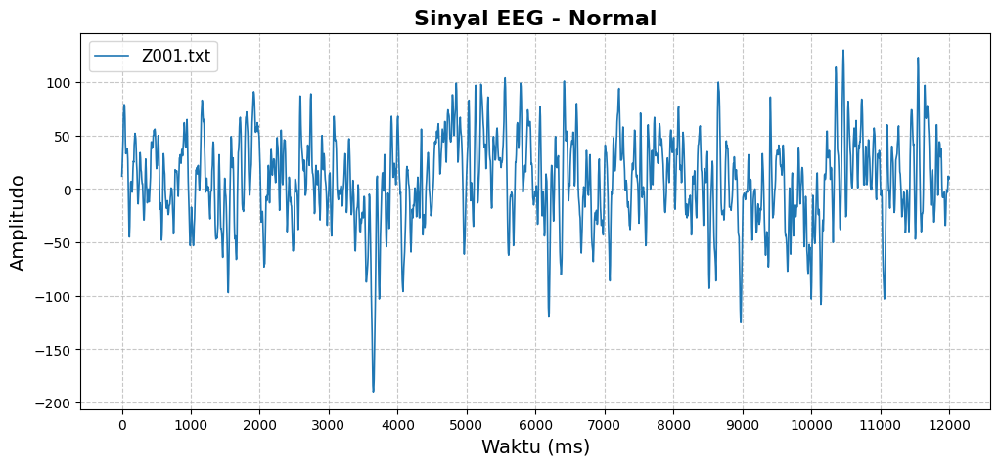

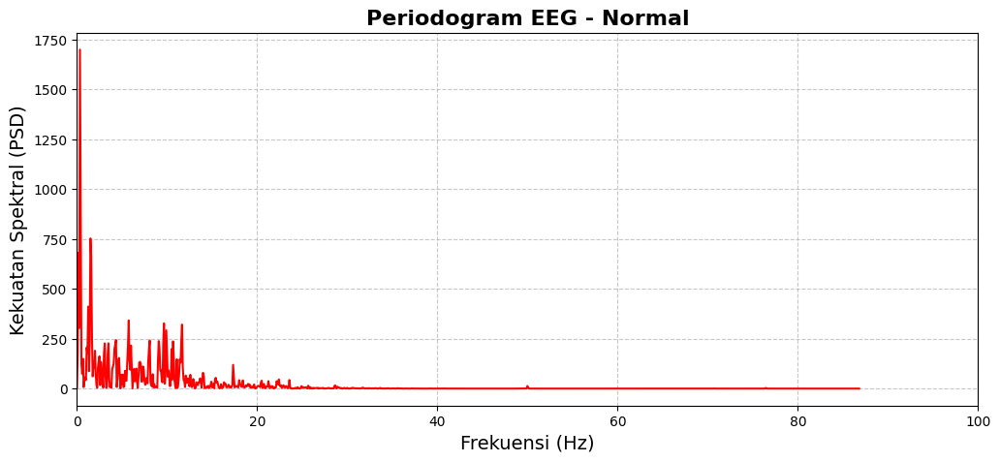

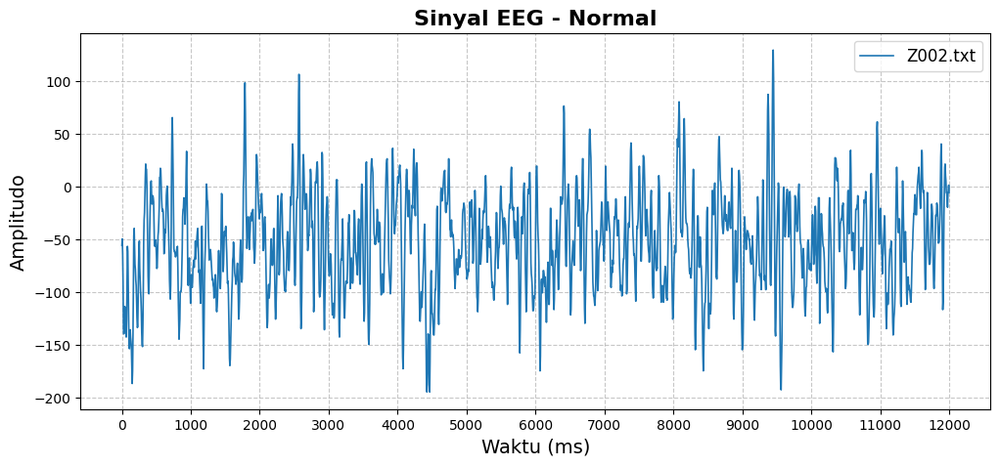

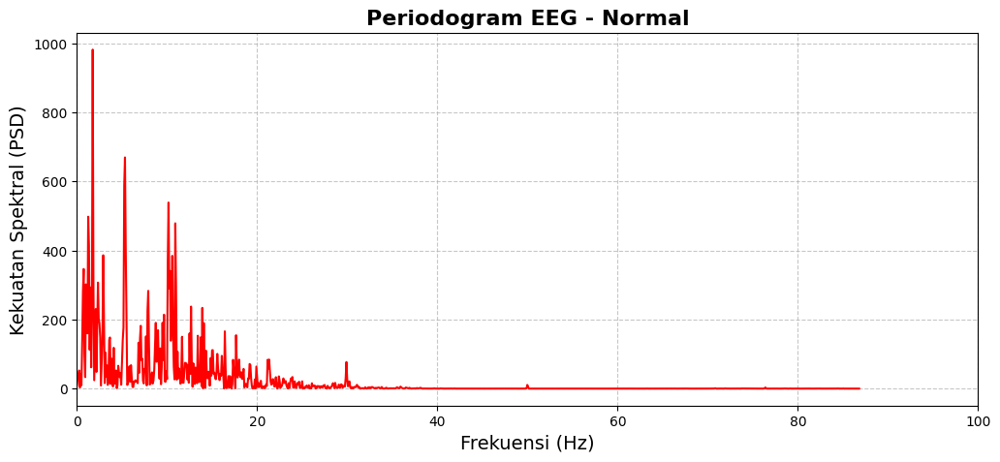

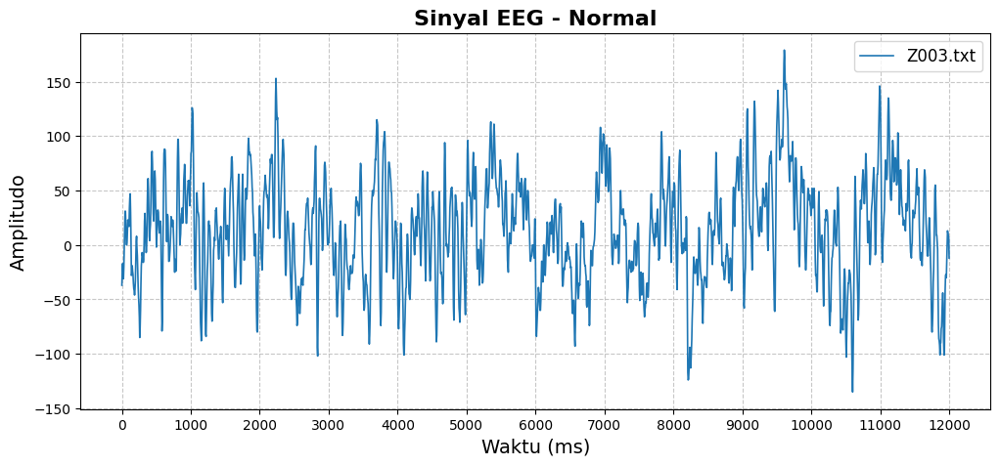

...

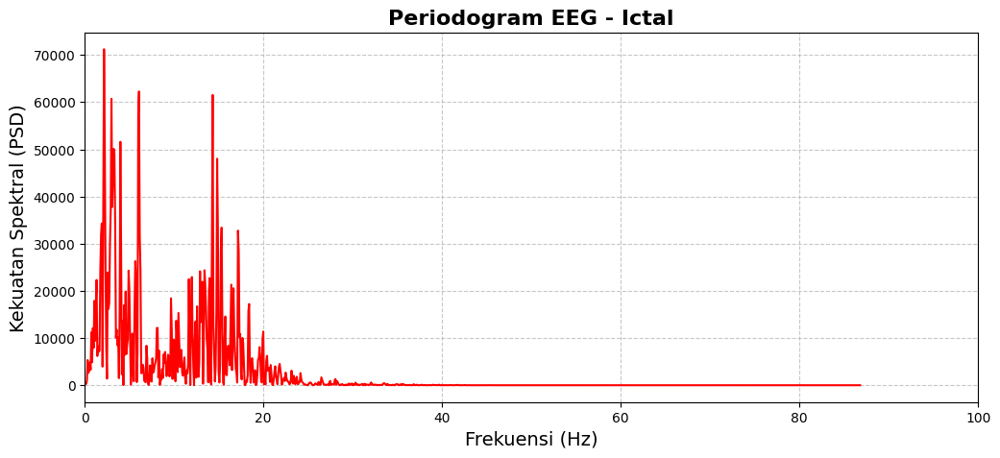

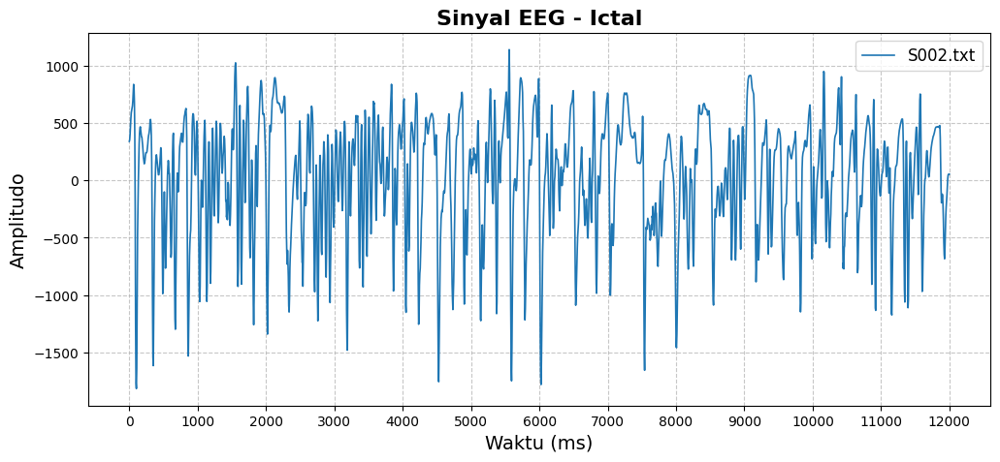

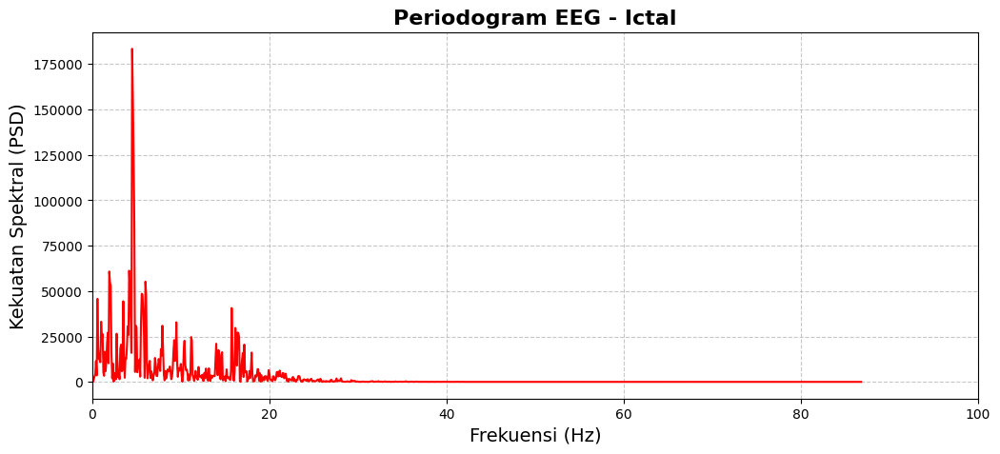

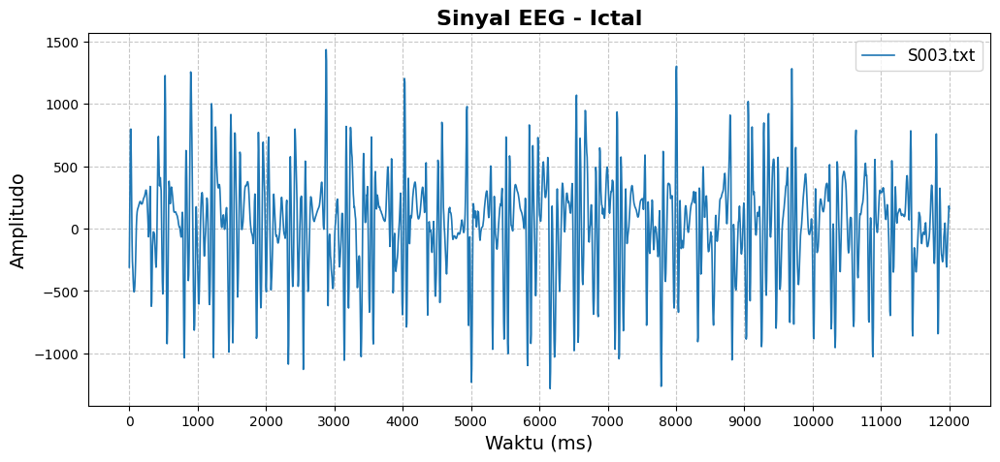

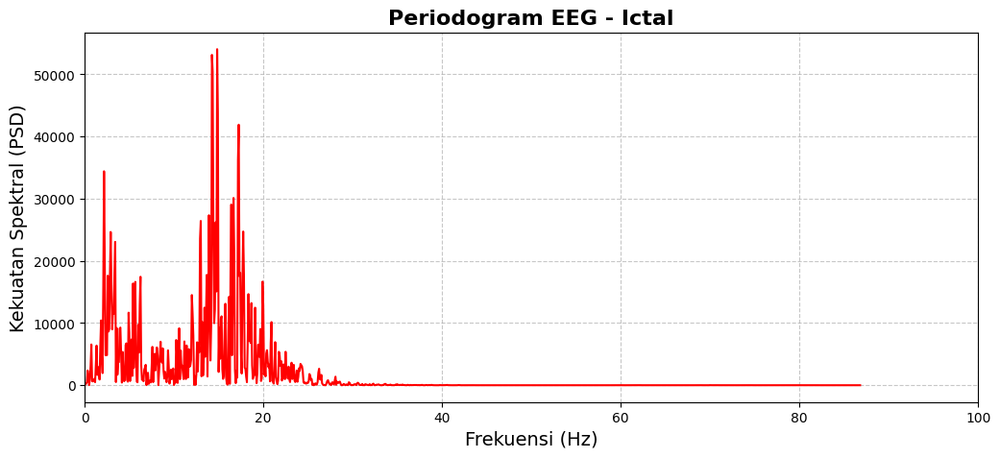

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import periodogram

# Parameter dataset
fs = 173.6  # Sampling frequency (Hz)
samples_per_label = 3  # Ambil 3 sampel per label

# Loop melalui tiap label
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama

    for _, row in subset.iterrows():
        signal = row["Signal"][:4096]  # Pastikan hanya 4096 sampel
        filename = row["Filename"]

        # **Konversi waktu ke milidetik**
        time_ms = (np.arange(len(signal)) / fs) * 1000

        # **Filter hanya rentang 0 - 12.000 ms**
        mask = (time_ms >= 0) & (time_ms <= 12000)
        time_ms = time_ms[mask]
        signal = signal[mask]

        # **Visualisasi Sinyal EEG**
        plt.figure(figsize=(12, 5))
        plt.plot(time_ms, signal, label=f"{filename}", linewidth=1.2)
        plt.xlabel("Waktu (ms)", fontsize=14)
        plt.ylabel("Amplitudo", fontsize=14)
        plt.title(f"Sinyal EEG - {label}", fontsize=16, fontweight="bold")
        plt.xticks(np.arange(0, 13000, 1000))  # Interval 1000 ms
        plt.legend(fontsize=12)
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()

        # **PERIODOGRAM (Spektrum Frekuensi)**
        freqs, Pxx = periodogram(signal, fs, window="hamming", scaling="density")

        # **Visualisasi Periodogram**
        plt.figure(figsize=(12, 5))
        plt.plot(freqs, Pxx, color='red', linewidth=1.5)
        plt.xlabel("Frekuensi (Hz)", fontsize=14)
        plt.ylabel("Kekuatan Spektral (PSD)", fontsize=14)
        plt.title(f"Periodogram EEG - {label}", fontsize=16, fontweight="bold")
        plt.xlim([0, 100])  # Fokus pada 0-100 Hz
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()


### Welch Power Spectral Density

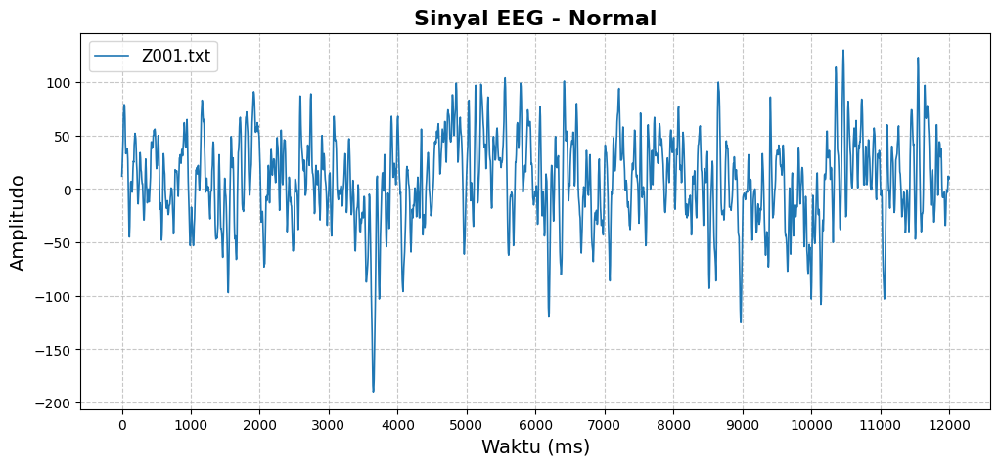

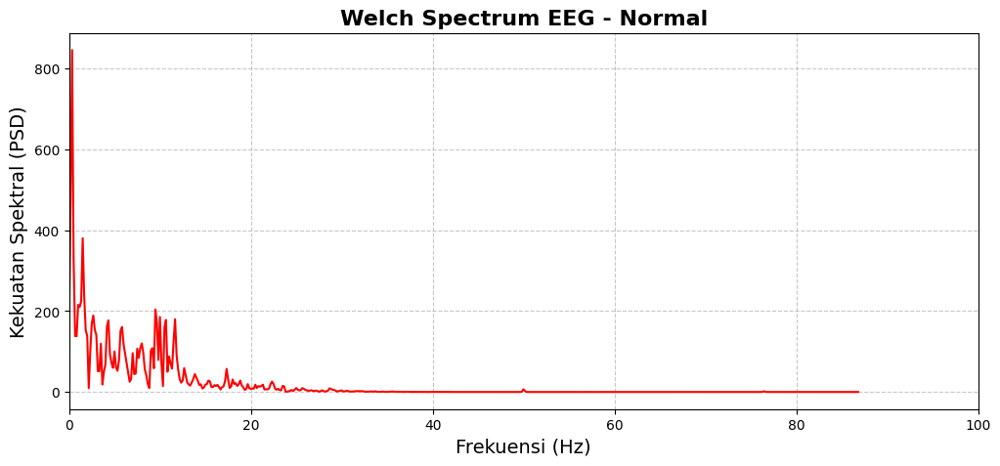

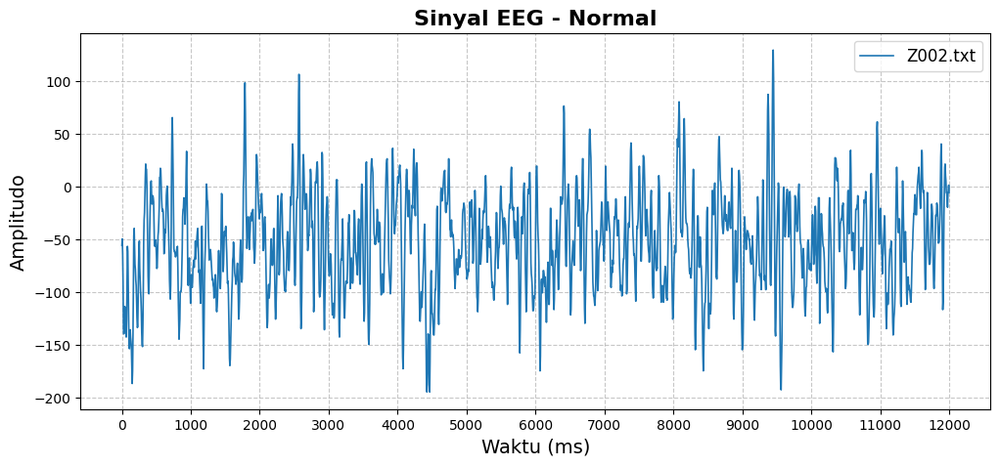

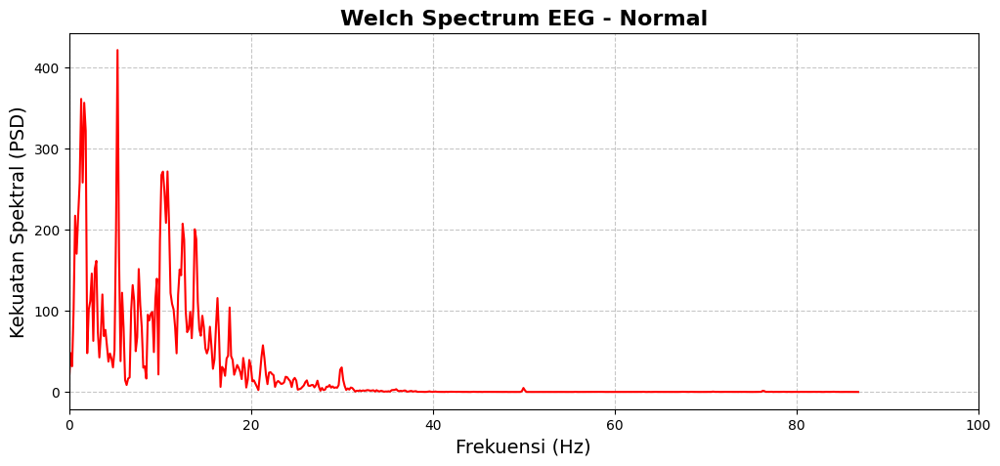

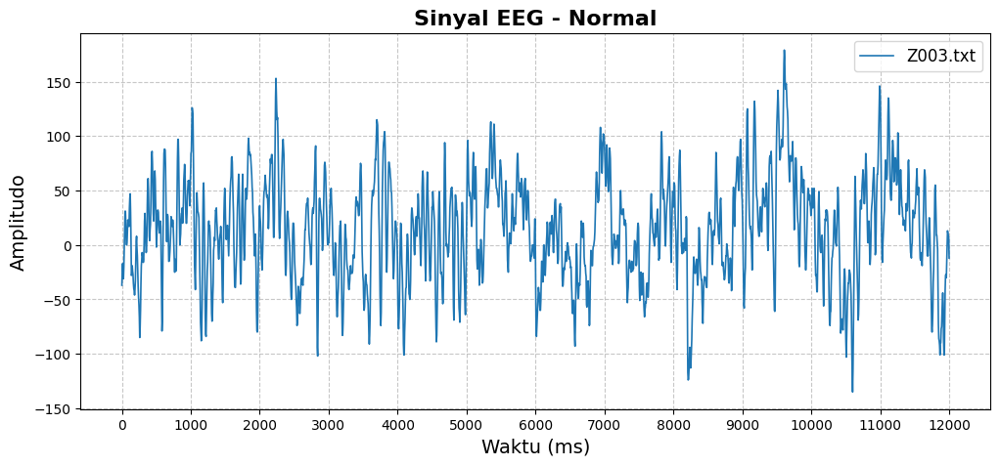

...

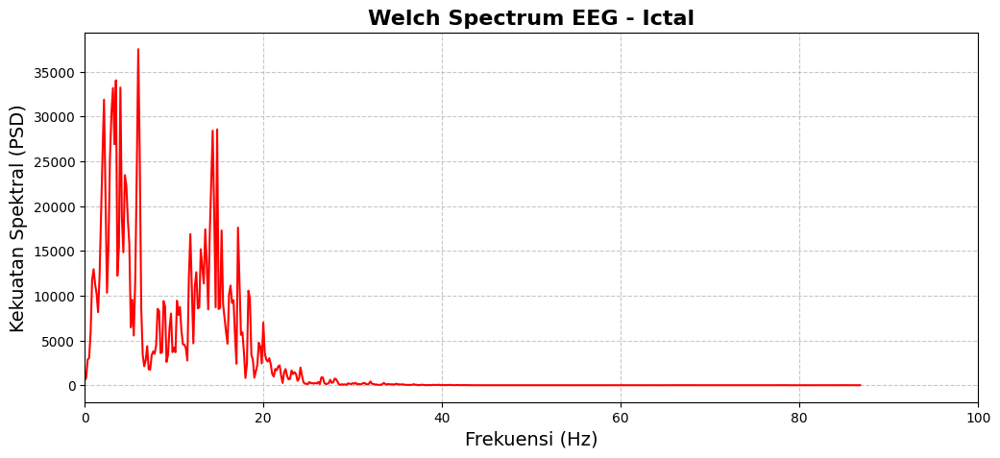

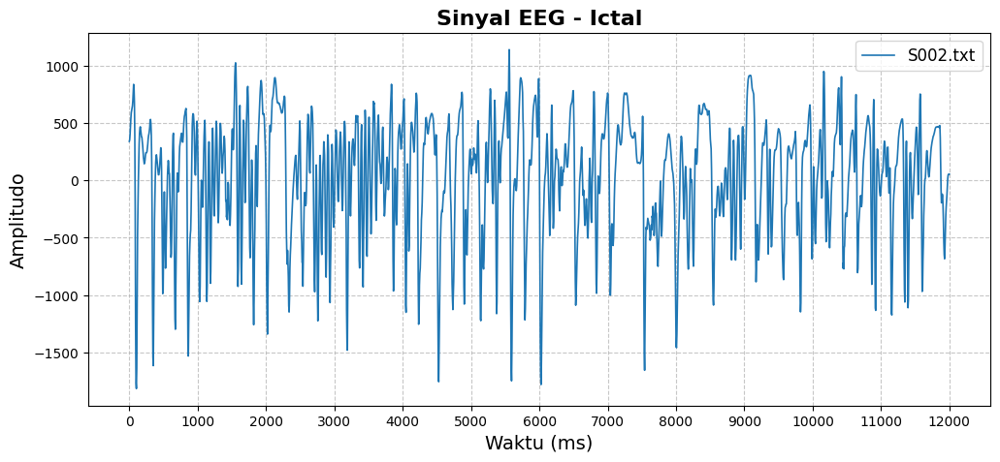

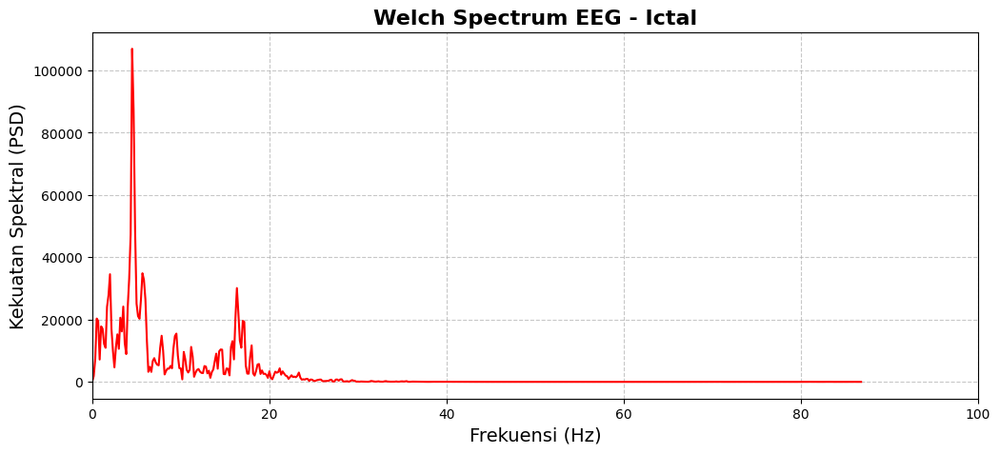

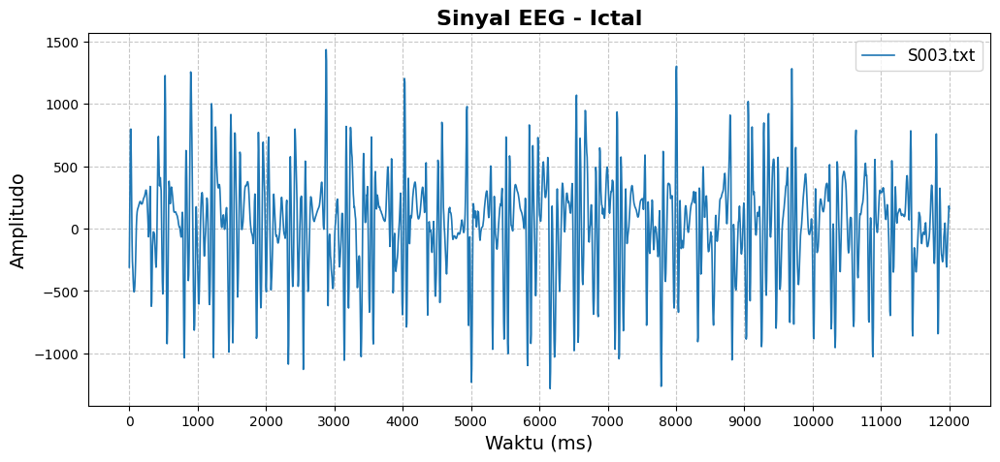

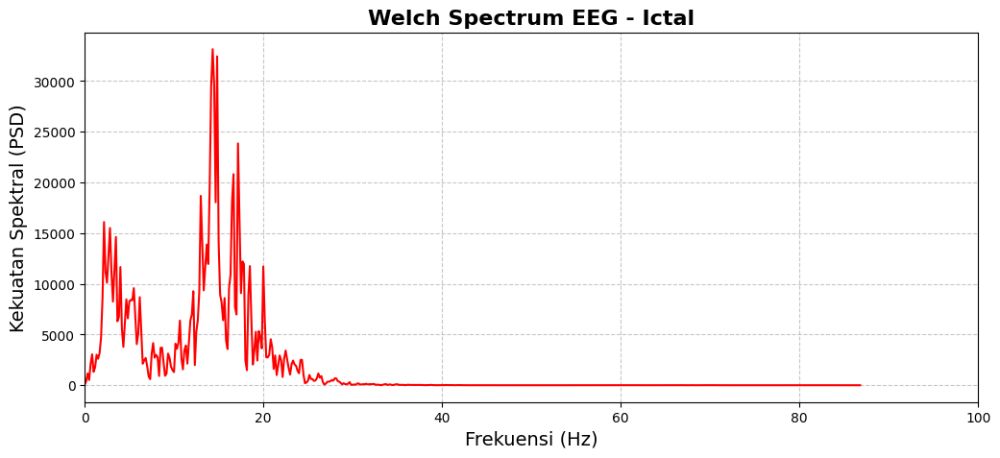

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# **Parameter Dataset Bonn**
fs = 173.6  # Sampling frequency (Hz)
samples_per_label = 3  # Ambil 3 sampel per label

# **Loop untuk tiap label**
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama per label

    for _, row in subset.iterrows():
        signal = row["Signal"][:4096]  # Pastikan hanya 4096 sampel
        filename = row["Filename"]

        # **Konversi waktu ke milidetik**
        time_ms = (np.arange(len(signal)) / fs) * 1000  # Dalam ms

        # **Filter hanya rentang 0 - 12.000 ms**
        mask = (time_ms >= 0) & (time_ms <= 12000)
        time_ms = time_ms[mask]
        signal = signal[mask]

        # **Visualisasi Sinyal EEG**
        plt.figure(figsize=(12, 5))
        plt.plot(time_ms, signal, label=f"{filename}", linewidth=1.2)
        plt.xlabel("Waktu (ms)", fontsize=14)
        plt.ylabel("Amplitudo", fontsize=14)
        plt.title(f"Sinyal EEG - {label}", fontsize=16, fontweight="bold")
        plt.xticks(np.arange(0, 13000, 1000))  # Interval setiap 1000 ms
        plt.legend(fontsize=12)
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()

        # **Welch Power Spectral Density (PSD)**
        segment_length = len(signal) // 2  # Panjang segmen
        noverlap = segment_length // 2  # Overlap 50%
        freqs, Pxx = welch(signal, fs, nperseg=segment_length, noverlap=noverlap, scaling="density")

        # **Visualisasi Welch Spectrum**
        plt.figure(figsize=(12, 5))
        plt.plot(freqs, Pxx, color='red', linewidth=1.5)
        plt.xlabel("Frekuensi (Hz)", fontsize=14)
        plt.ylabel("Kekuatan Spektral (PSD)", fontsize=14)
        plt.title(f"Welch Spectrum EEG - {label}", fontsize=16, fontweight="bold")
        plt.xlim([0, 100])  # Fokus pada 0-50 Hz
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()


## Time-Frequency Analysis

### Short-Time Fourier Transform: The Spectrogram


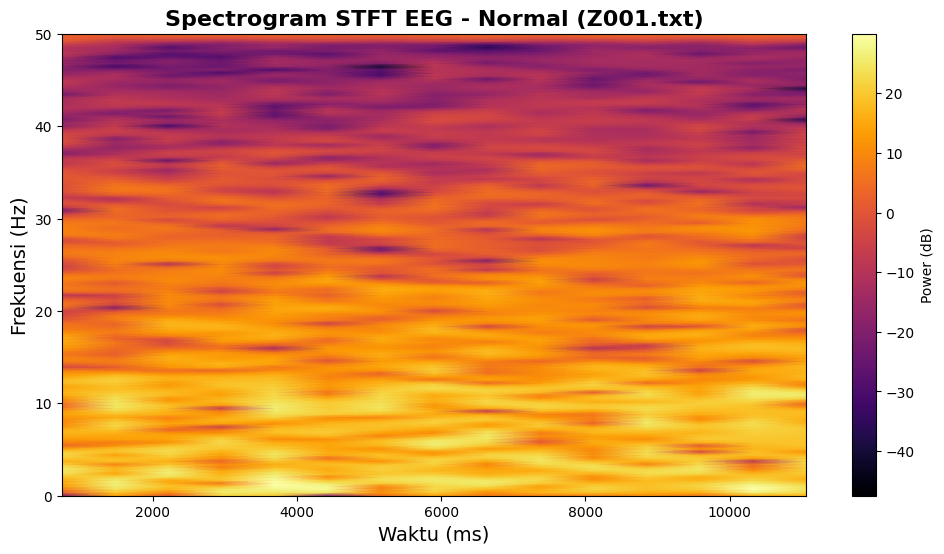

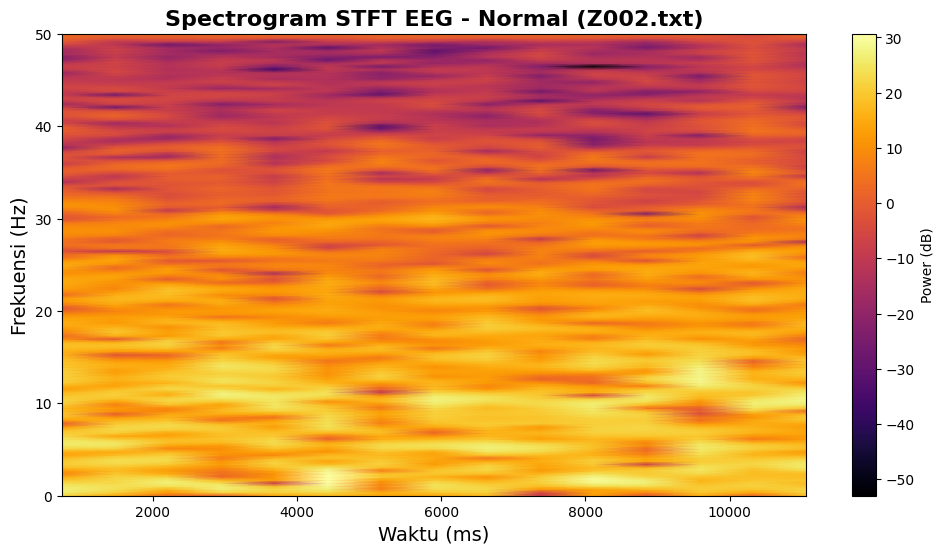

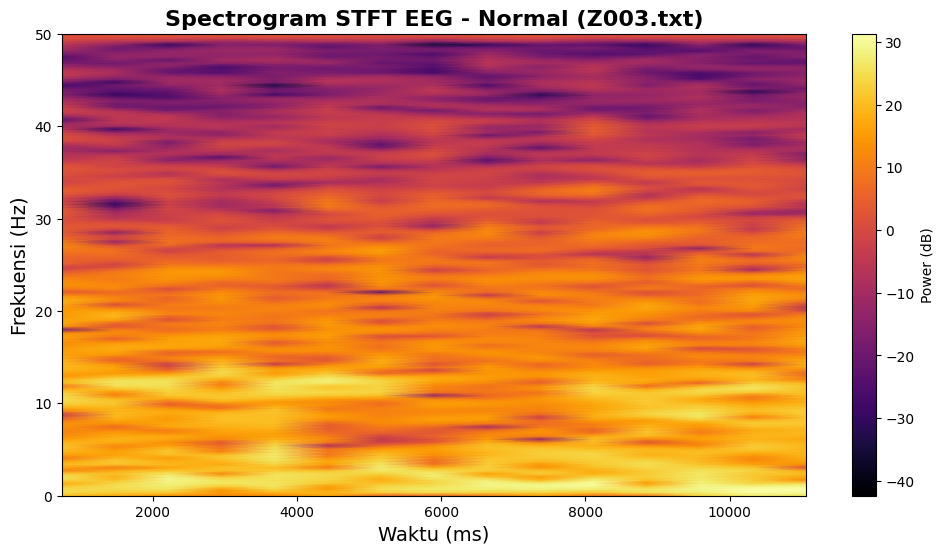

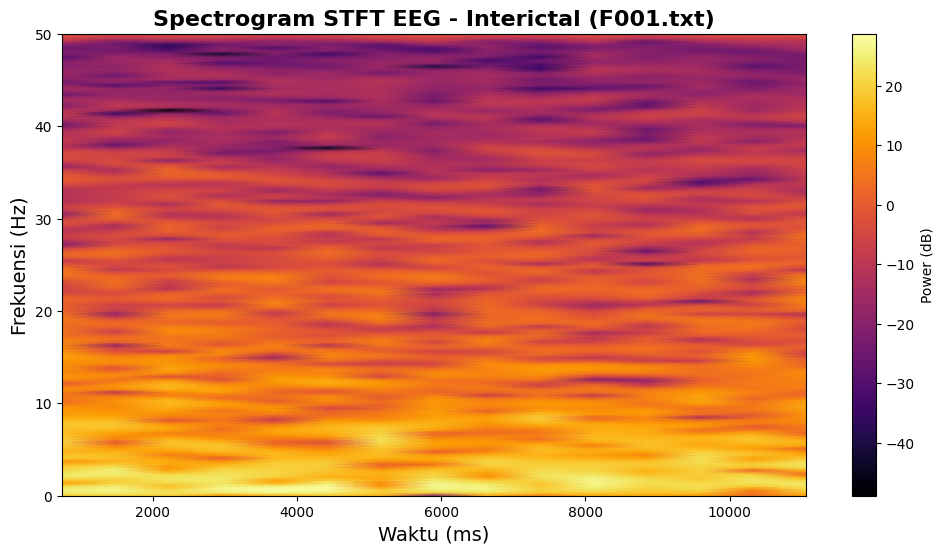

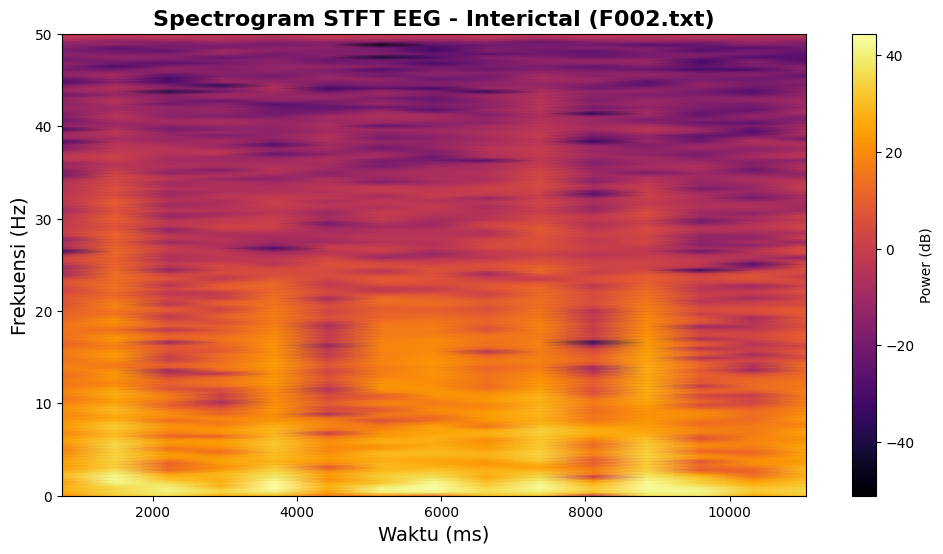

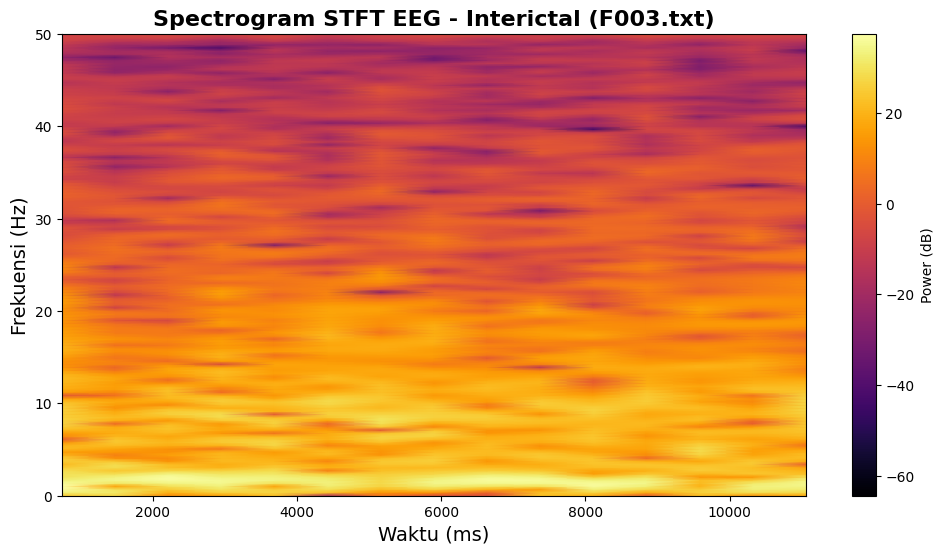

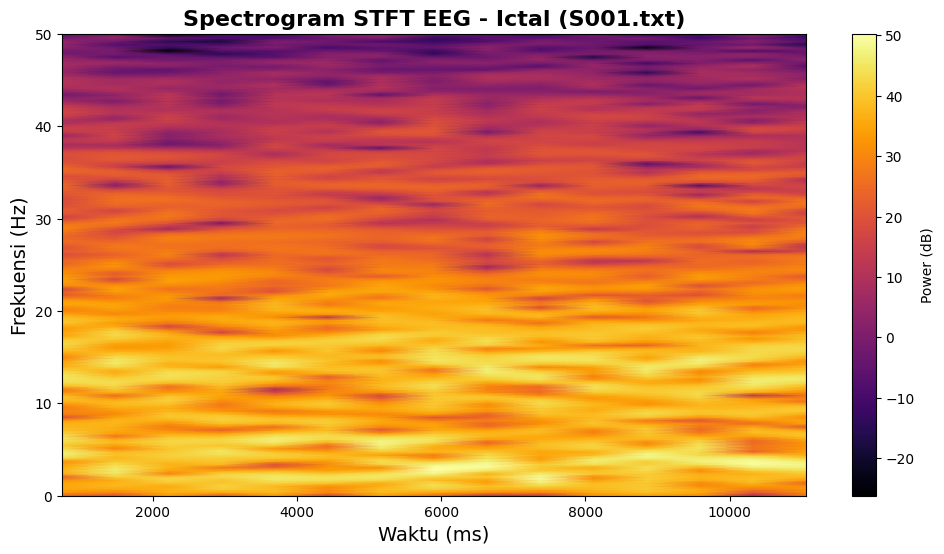

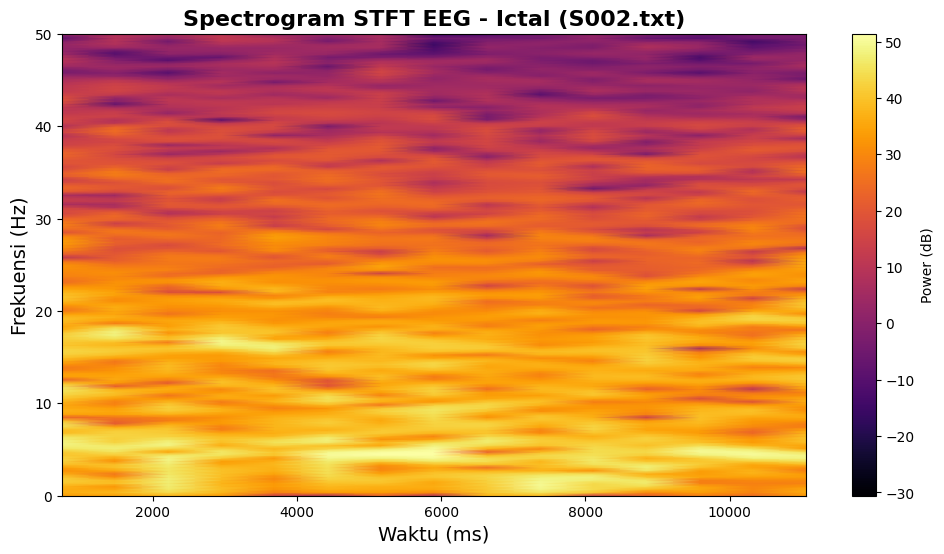

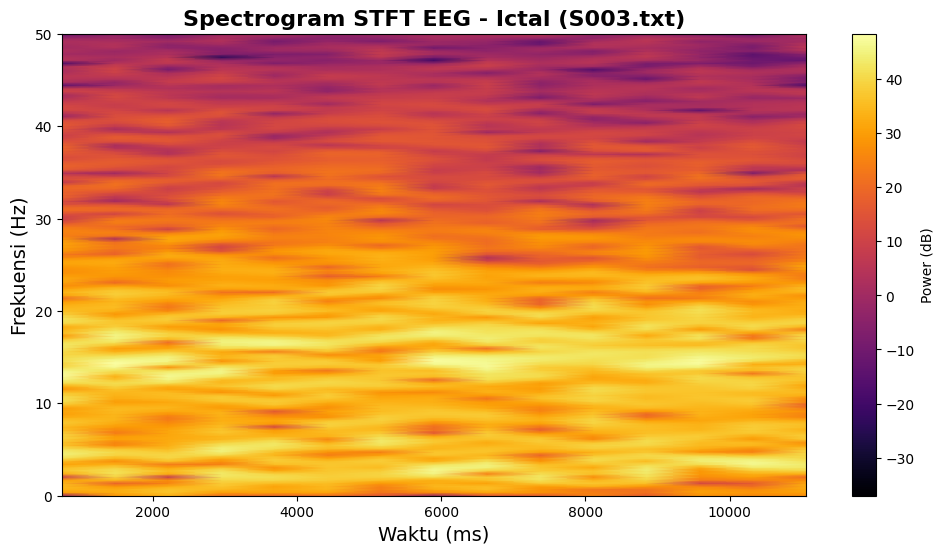

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram

# **Parameter Dataset Bonn**
Fs = 173.6  # Sampling frequency (Hz)
samples_per_label = 3  # Ambil 3 sampel per label

# **Parameter STFT**
segment_len = 256  # Panjang segmen STFT
noverlap = 128  # Overlap antar segmen
NFFT = 512  # Resolusi FFT

# **Loop untuk tiap label**
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama per label

    for _, row in subset.iterrows():
        signal = row["Signal"][:4096]  # Pastikan hanya 4096 sampel
        filename = row["Filename"]

        # **Konversi waktu ke milidetik**
        time_ms = (np.arange(len(signal)) / Fs) * 1000  # Dalam ms

        # **Filter hanya rentang 0 - 12.000 ms**
        mask = (time_ms >= 0) & (time_ms <= 12000)
        time_ms = time_ms[mask]
        signal = signal[mask]

        # **Hitung STFT menggunakan Spectrogram**
        f, t, Sxx = spectrogram(signal, fs=Fs, window='hamming', nperseg=segment_len, noverlap=noverlap, nfft=NFFT)

        # **Visualisasi Spectrogram STFT**
        plt.figure(figsize=(12, 6))
        plt.pcolormesh(t * 1000, f, 10 * np.log10(Sxx), shading='gouraud', cmap="inferno")
        plt.colorbar(label="Power (dB)")
        plt.xlabel("Waktu (ms)", fontsize=14)
        plt.ylabel("Frekuensi (Hz)", fontsize=14)
        plt.title(f"Spectrogram STFT EEG - {label} ({filename})", fontsize=16, fontweight="bold")
        plt.ylim([0, 50])  # Fokus pada 0-50 Hz
        plt.show()


###  Discrete Wavelet Transform

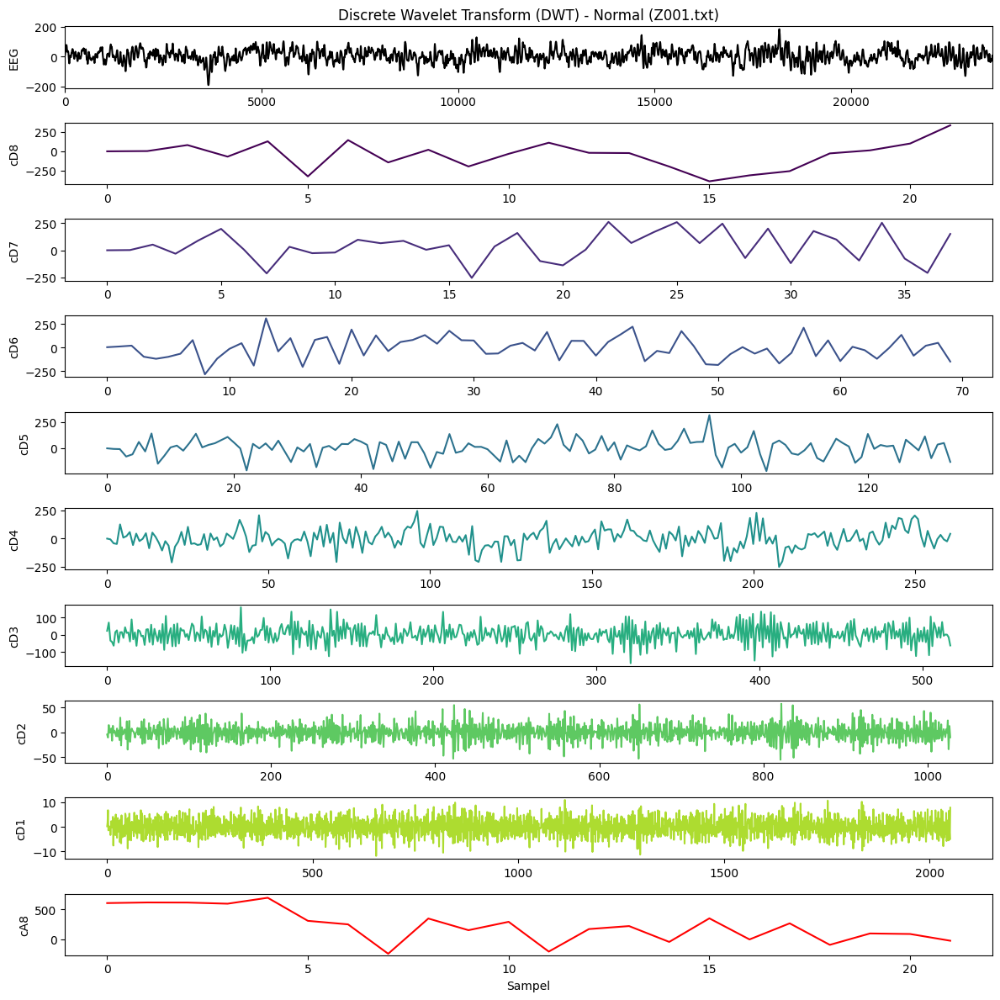

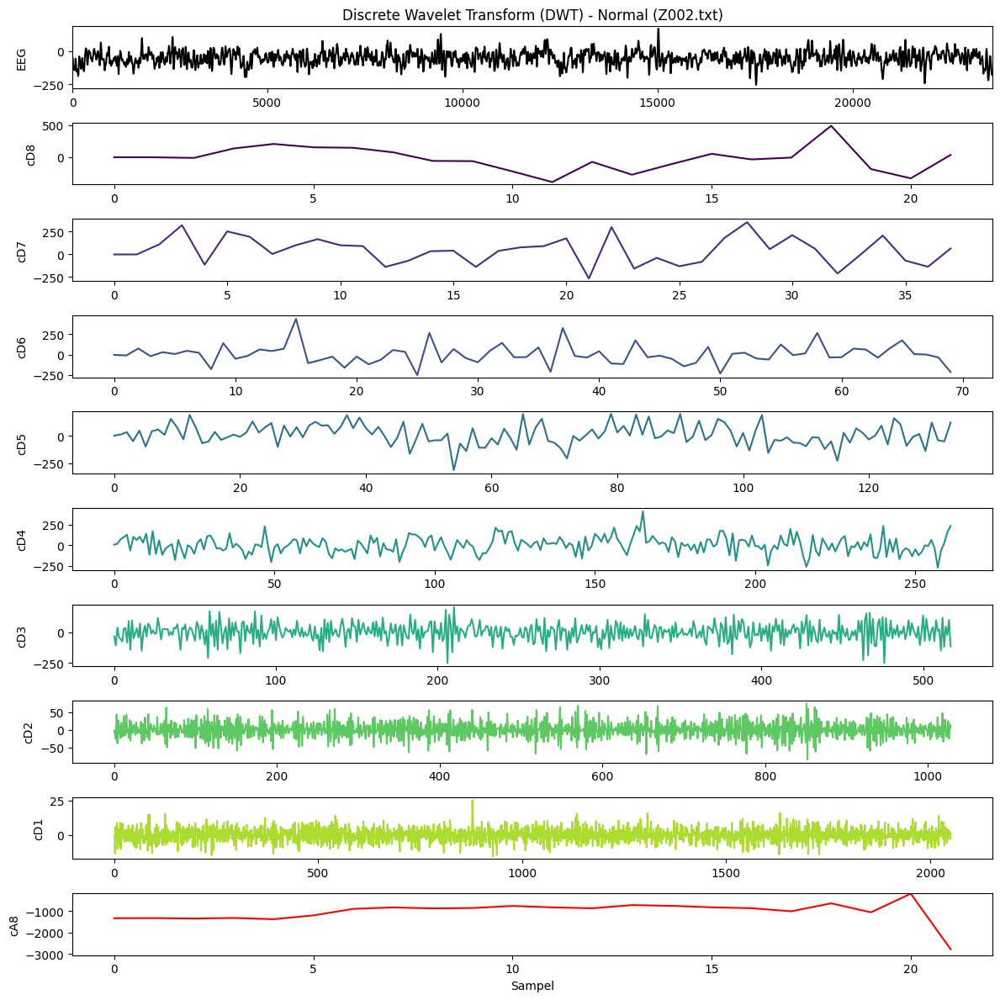

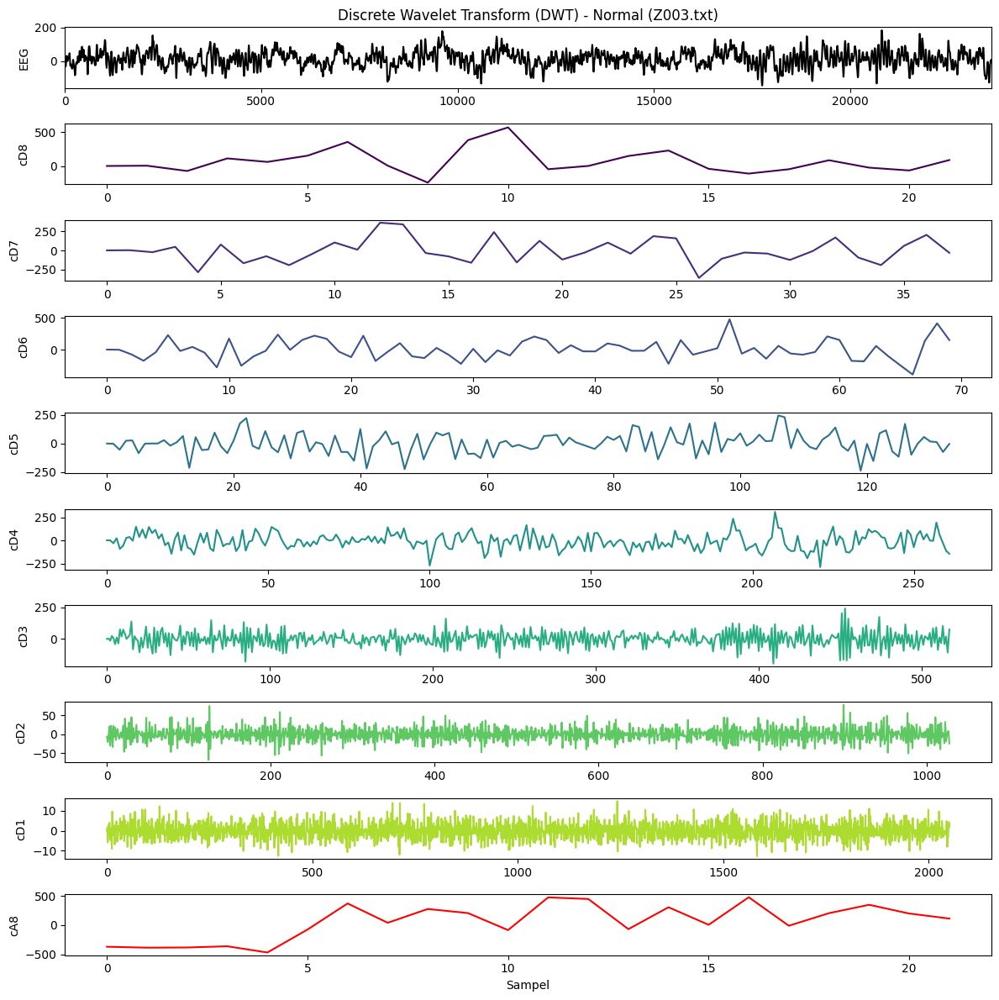

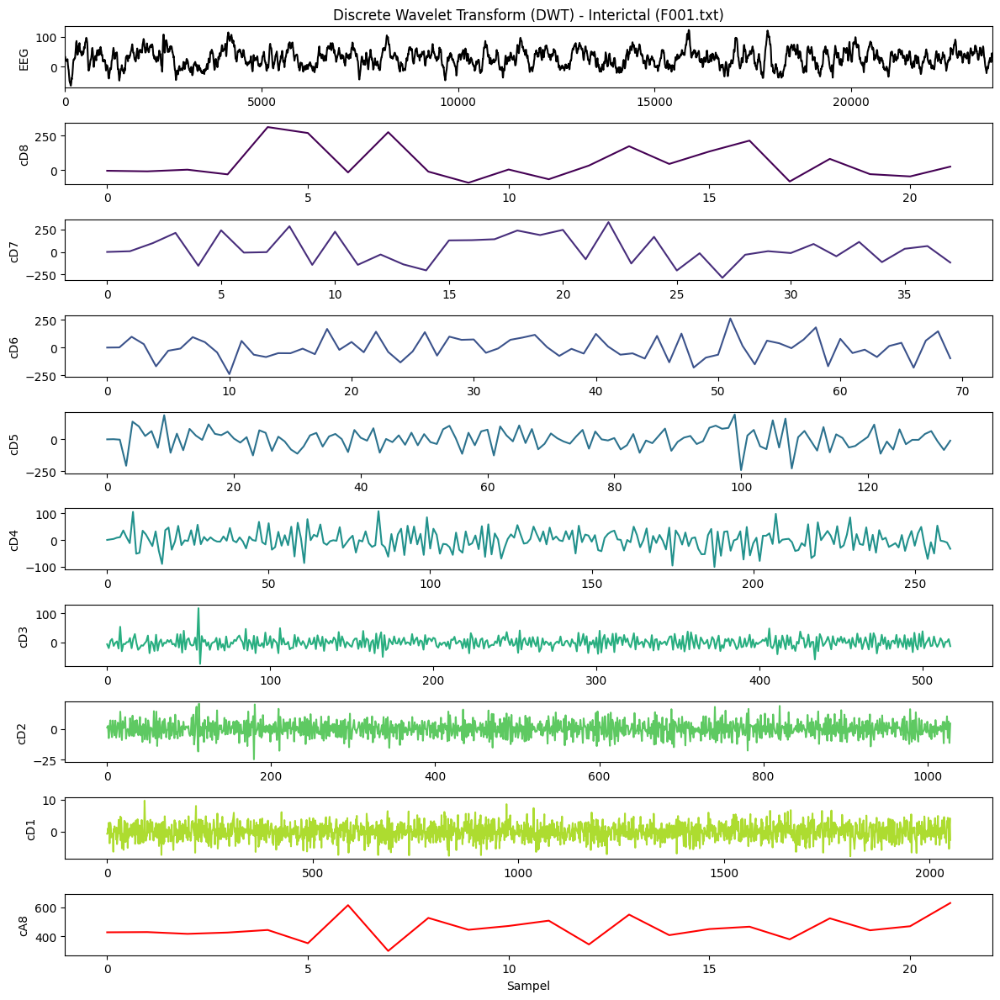

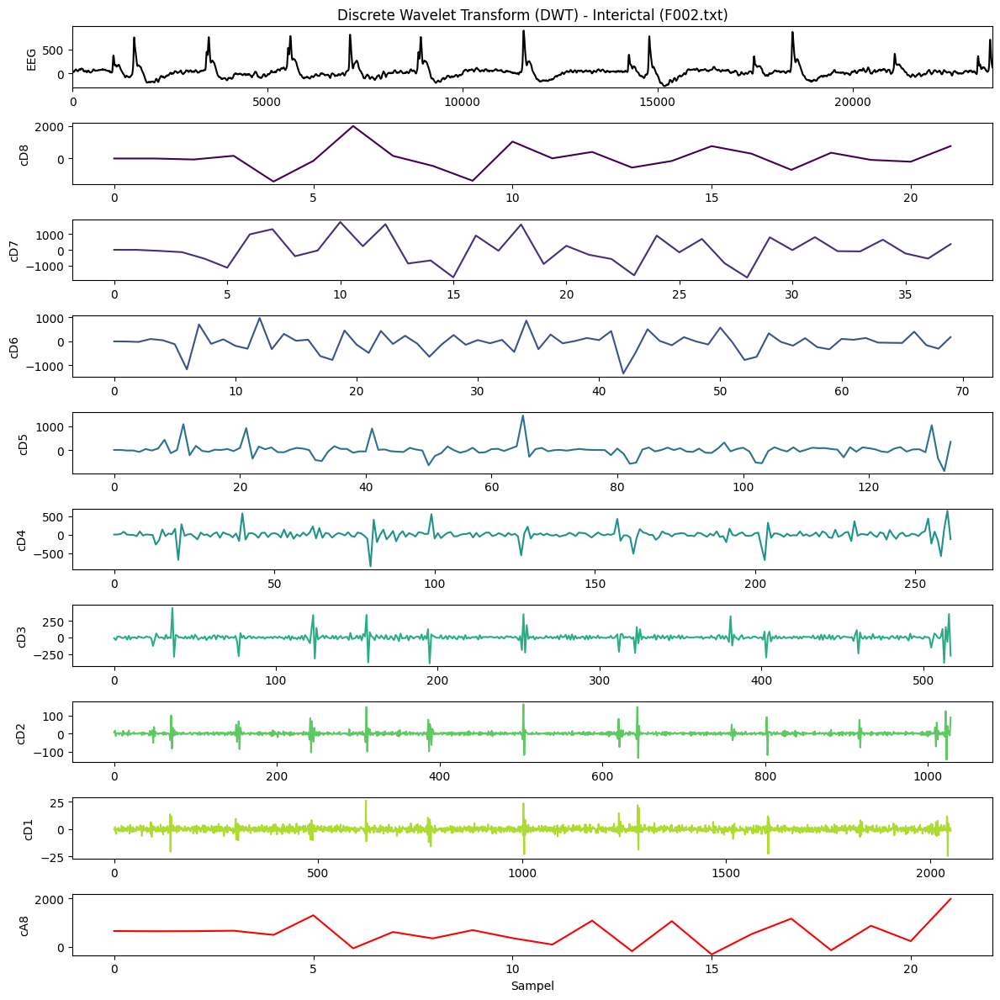

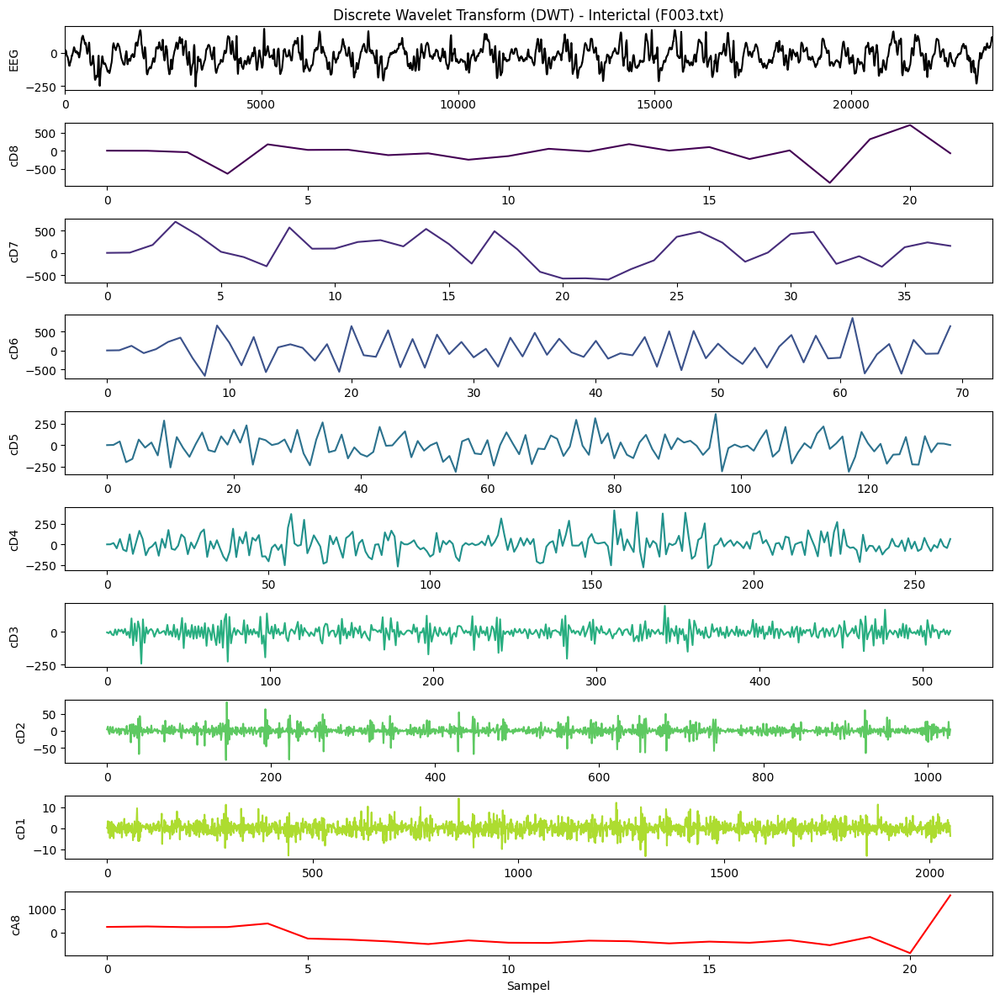

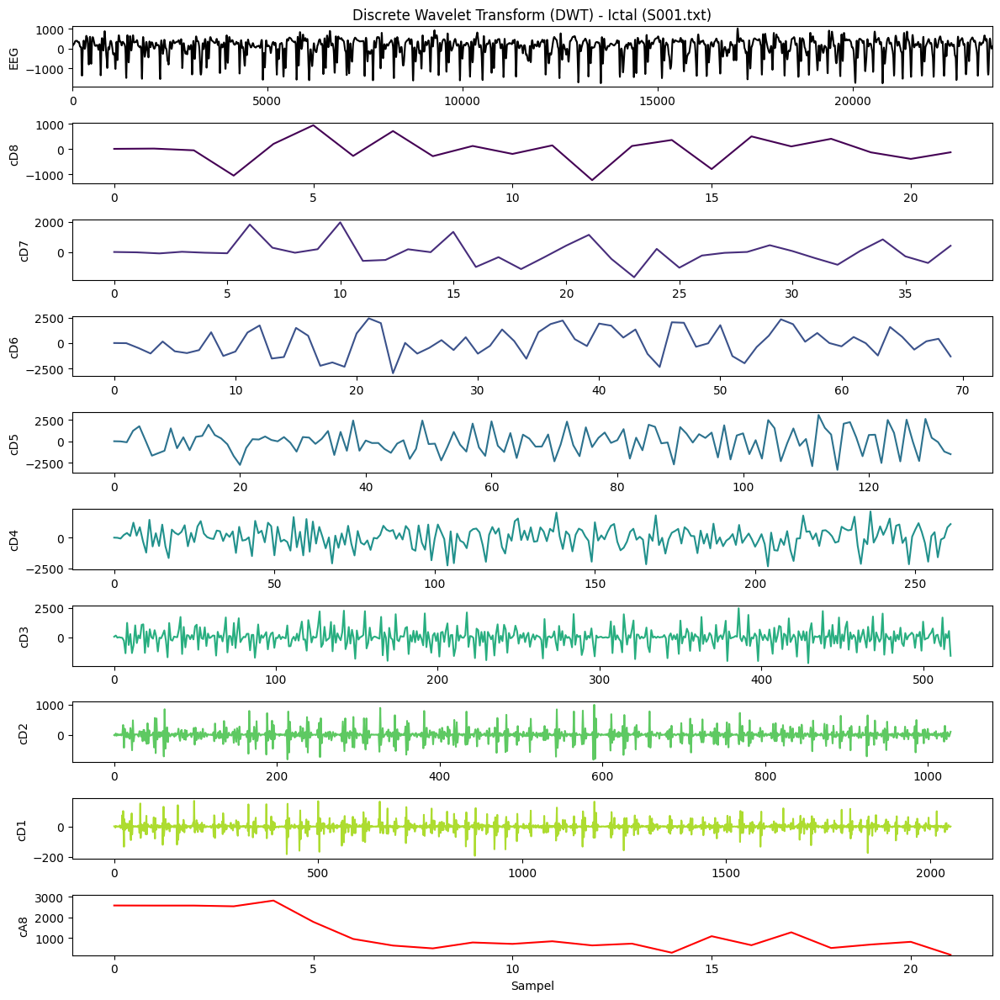

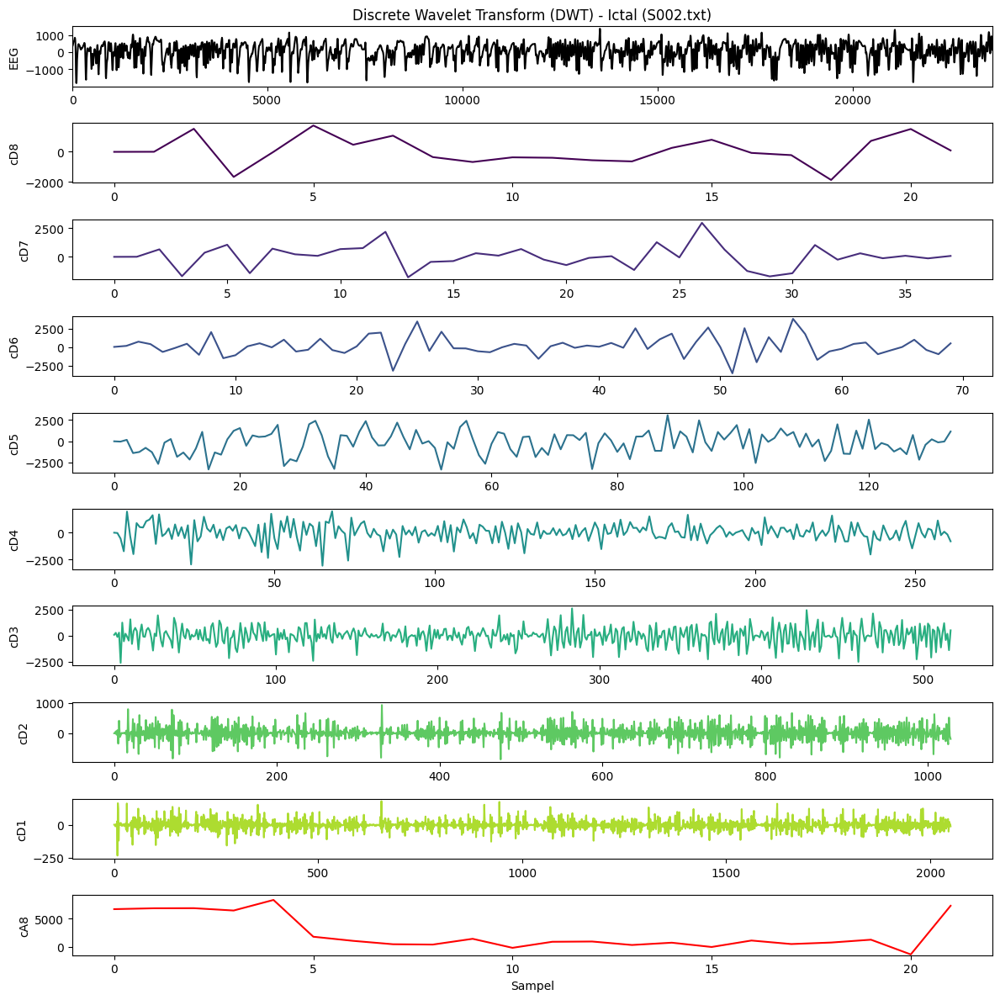

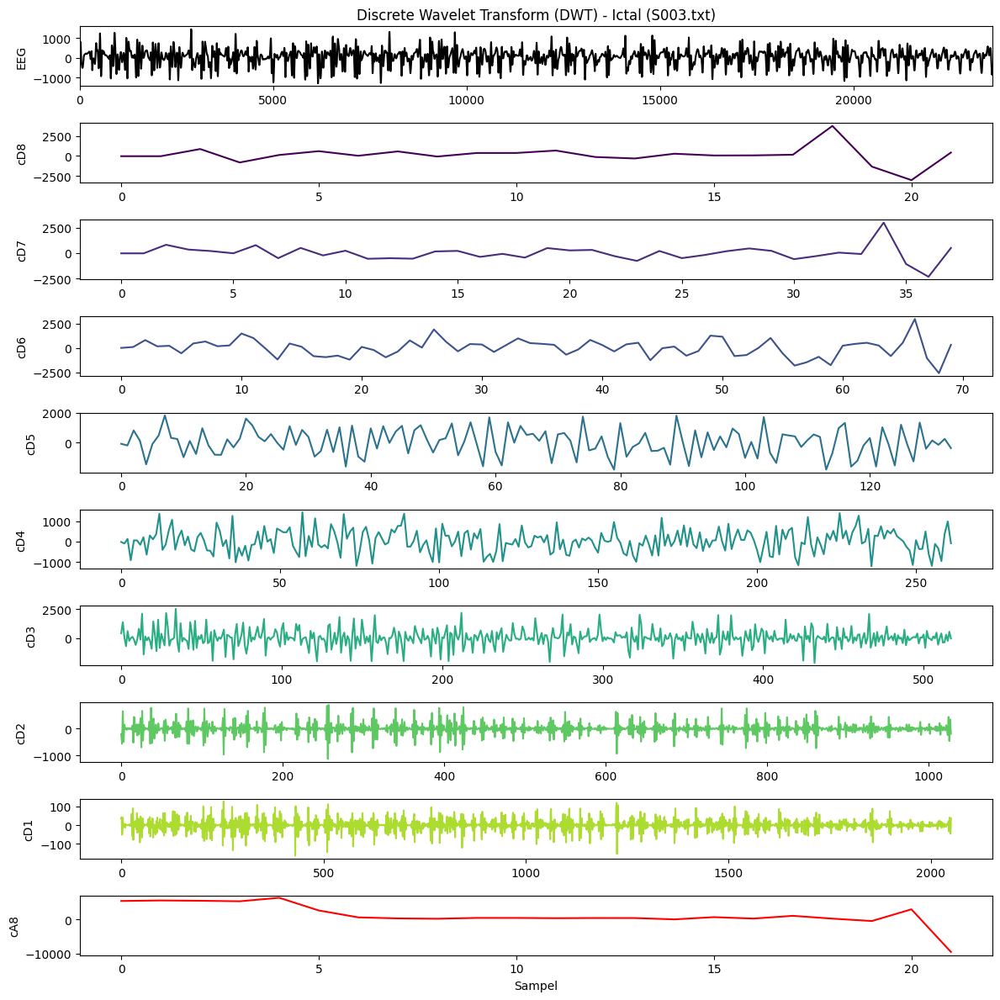

Fitur DWT berhasil diekstrak dan disimpan dalam DWT_EEG_Features.csv


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
from scipy.stats import skew, kurtosis

# **Parameter Dataset Bonn**
Fs = 173.6  # Sampling frequency (Hz)
samples_per_label = 3  # Ambil 3 sampel per label
wavelet = "db4"  # Wavelet yang digunakan
level = 8  # Level dekomposisi
signal_length = 4096  # Pastikan panjang sinyal 4096

# **DataFrame untuk menyimpan fitur**
columns = ["Label"]
for i in range(1, level + 1):
    columns += [f"Mean_cD{i}", f"Std_cD{i}", f"Skew_cD{i}", f"Kurt_cD{i}", f"RMS_cD{i}"]
columns.append("Mean_cA8")  # Approximation coefficient terakhir
df_features = pd.DataFrame(columns=columns)

# **Loop untuk tiap label**
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama per label

    for _, row in subset.iterrows():
        signal = row["Signal"][:signal_length]  # Ambil 4096 sampel
        filename = row["Filename"]

        # **Konversi waktu ke milidetik**
        time_ms = (np.arange(len(signal)) / Fs) * 1000

        # **Padding jika sinyal kurang dari 4096 sampel**
        if len(signal) < signal_length:
            pad_width = signal_length - len(signal)
            signal = np.pad(signal, (0, pad_width), mode="constant")

        # **Dekomposisi Wavelet hingga level 8**
        coeffs = pywt.wavedec(signal, wavelet, level=level)
        cA8 = coeffs[0]  # Approximation coefficient (level 8)
        detail_coeffs = coeffs[1:]  # Detail coefficients dari level 8 - 1

        # **Ekstraksi fitur statistik**
        features = [label]
        for cD in detail_coeffs:
            features += [
                np.mean(np.abs(cD)),  # Mean absolute
                np.std(cD),           # Standard deviation
                skew(cD),             # Skewness
                kurtosis(cD),         # Kurtosis
                np.sqrt(np.mean(cD**2))  # RMS
            ]
        features.append(np.mean(np.abs(cA8)))  # Mean absolute dari Approximation coefficient

        # **Simpan fitur ke DataFrame**
        df_features.loc[len(df_features)] = features

        # **Visualisasi sinyal asli dan hasil DWT**
        plt.figure(figsize=(12, 12))  # Ukuran lebih besar

        plt.subplot(level + 2, 1, 1)
        plt.plot(time_ms, signal, label="Sinyal Asli", color="black")
        plt.ylabel("EEG")
        plt.title(f"Discrete Wavelet Transform (DWT) - {label} ({filename})")
        plt.xlim([0, max(time_ms)])
        plt.ylim([signal.min() - 0.1 * np.abs(signal.min()), signal.max() + 0.1 * np.abs(signal.max())])  # Perpanjang sumbu Y

        for i, cD in enumerate(detail_coeffs):
            plt.subplot(level + 2, 1, i + 2)
            plt.plot(cD, label=f"cD{level-i}", color=plt.cm.viridis(i / level))
            plt.ylabel(f"cD{level-i}")
            plt.ylim([cD.min() - 0.1 * np.abs(cD.min()), cD.max() + 0.1 * np.abs(cD.max())])  # Perpanjang sumbu Y

        plt.subplot(level + 2, 1, level + 2)
        plt.plot(cA8, label="cA8 (Approximation)", color="red")
        plt.ylabel("cA8")
        plt.xlabel("Sampel")
        plt.ylim([cA8.min() - 0.1 * np.abs(cA8.min()), cA8.max() + 0.1 * np.abs(cA8.max())])  # Perpanjang sumbu Y

        plt.tight_layout()
        plt.show()

# **Simpan fitur ke file CSV**
df_features.to_csv("DWT_EEG_Features.csv", index=False)
print("Fitur DWT berhasil diekstrak dan disimpan dalam DWT_EEG_Features.csv")


### Stationary Wavelet Transform

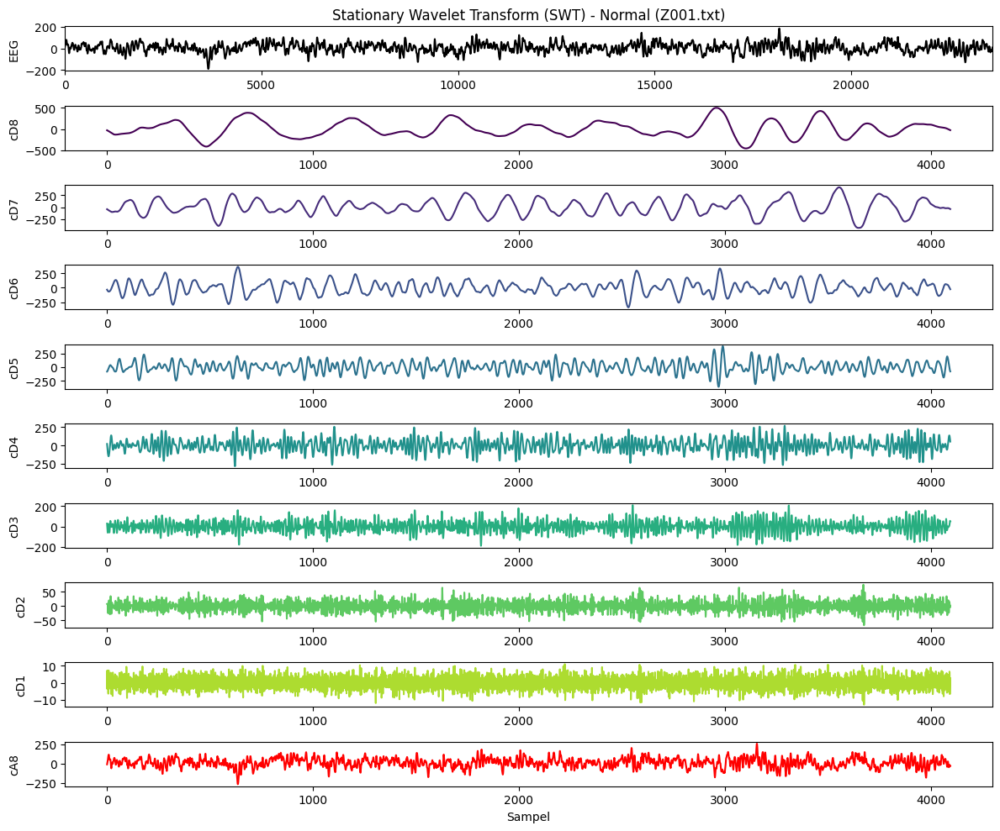

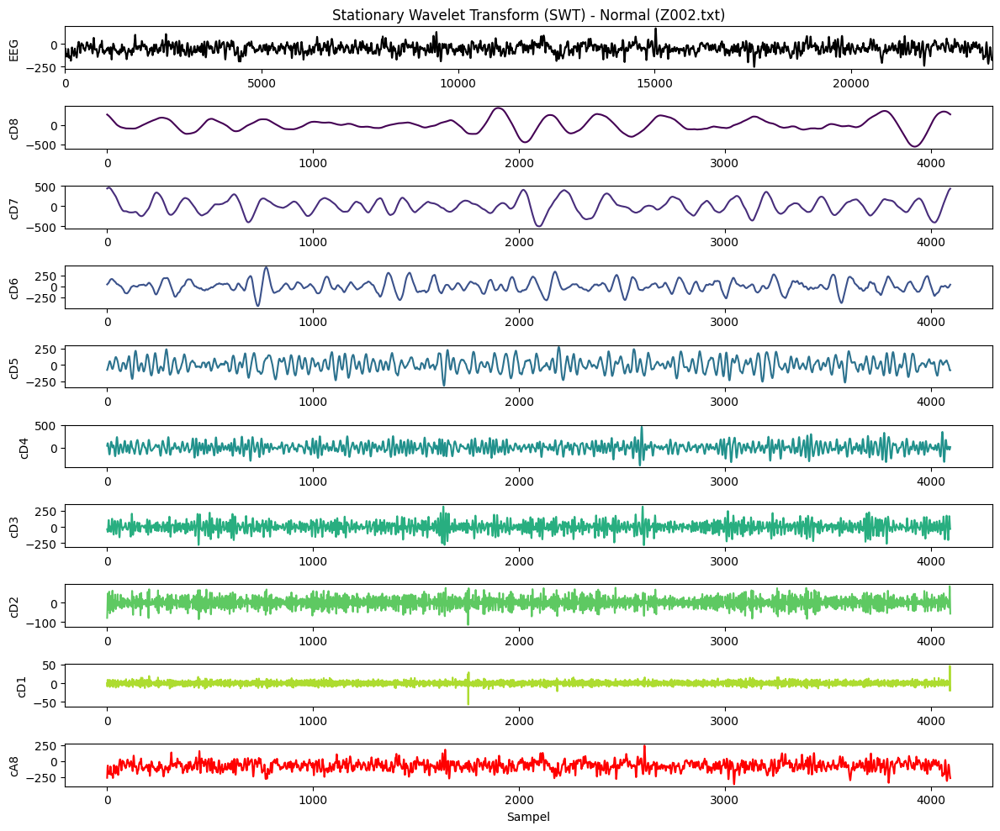

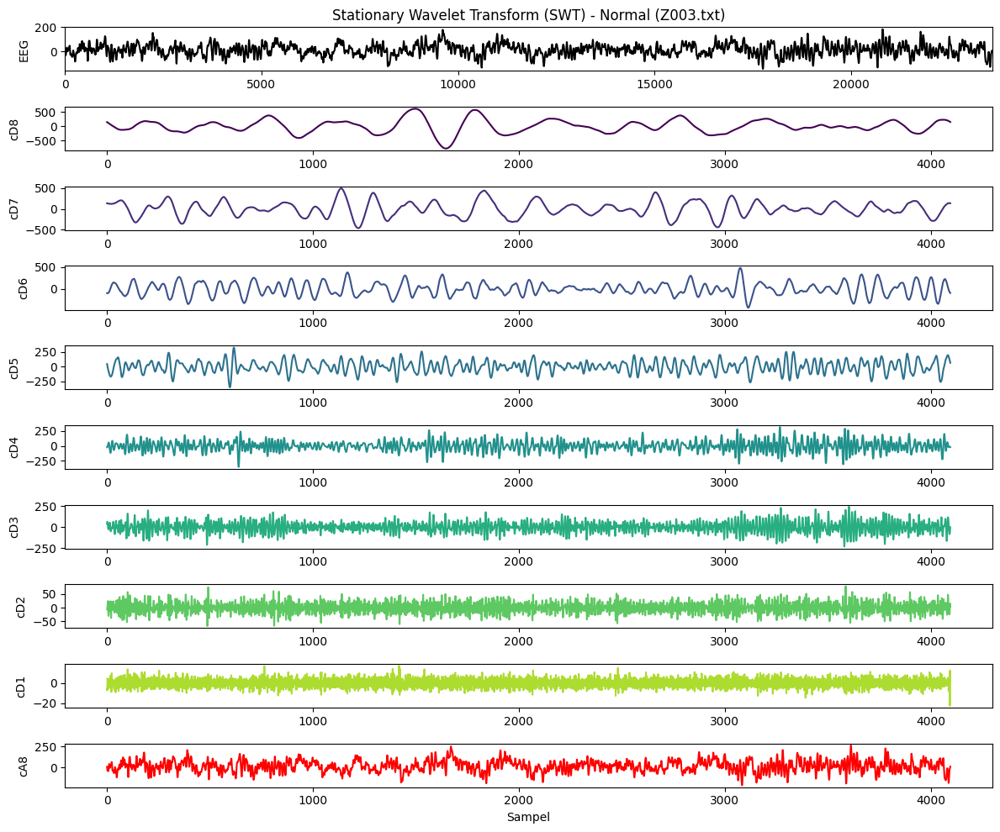

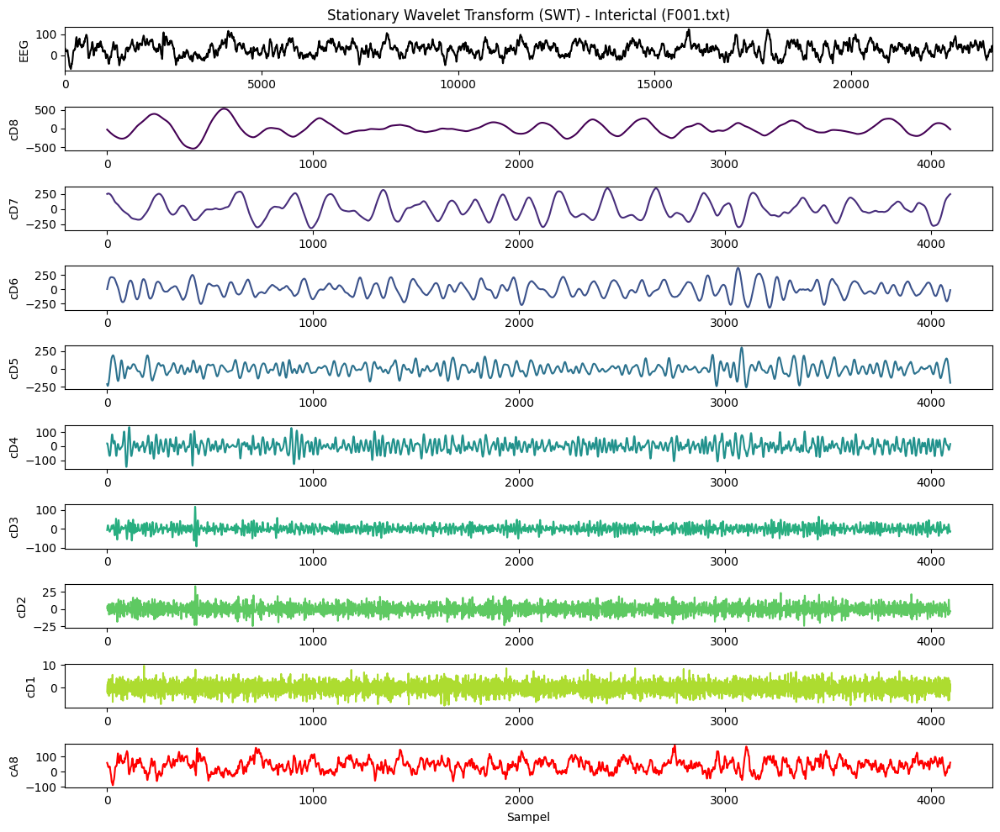

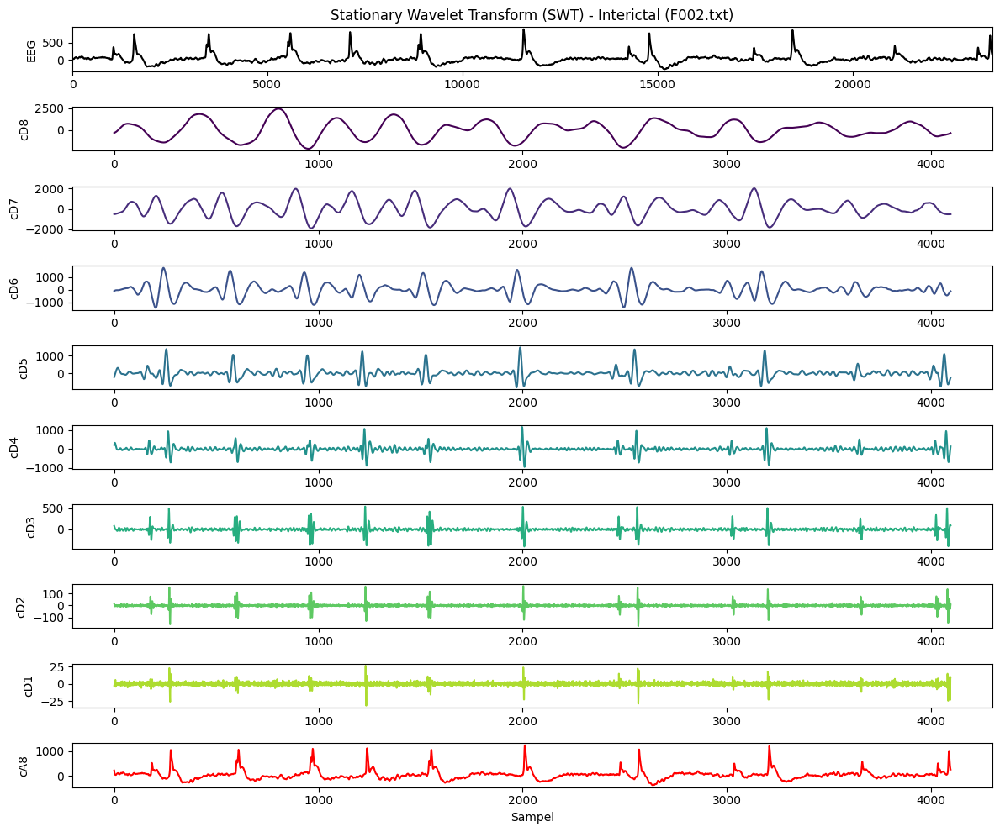

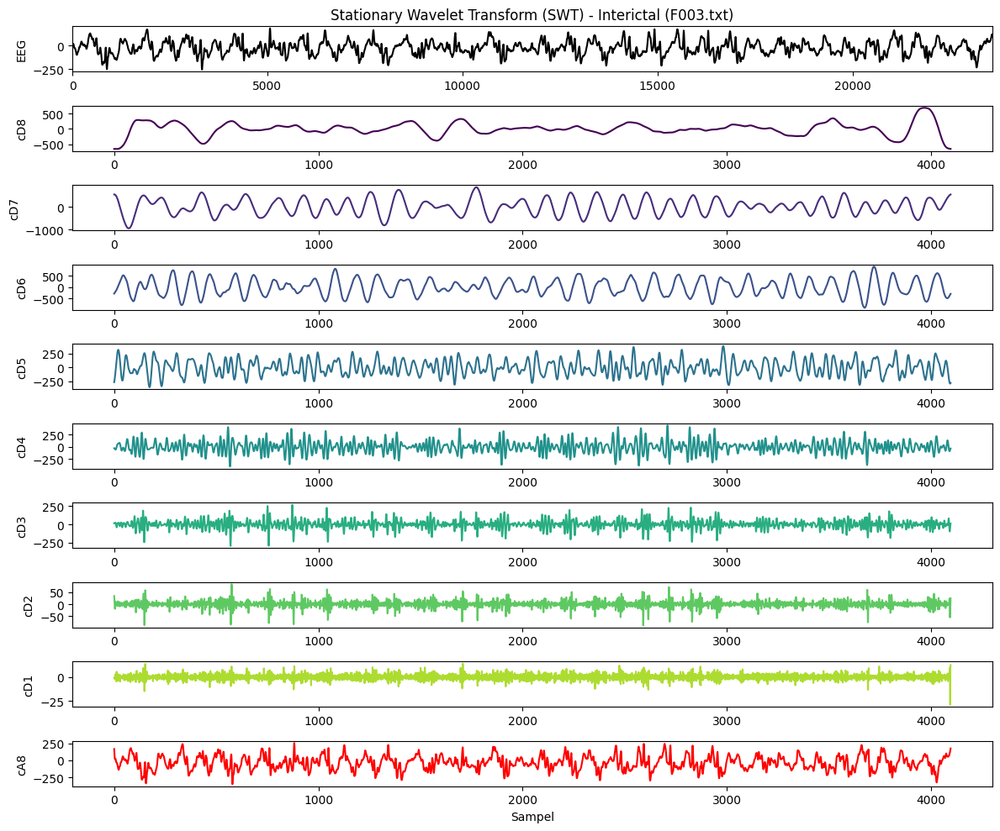

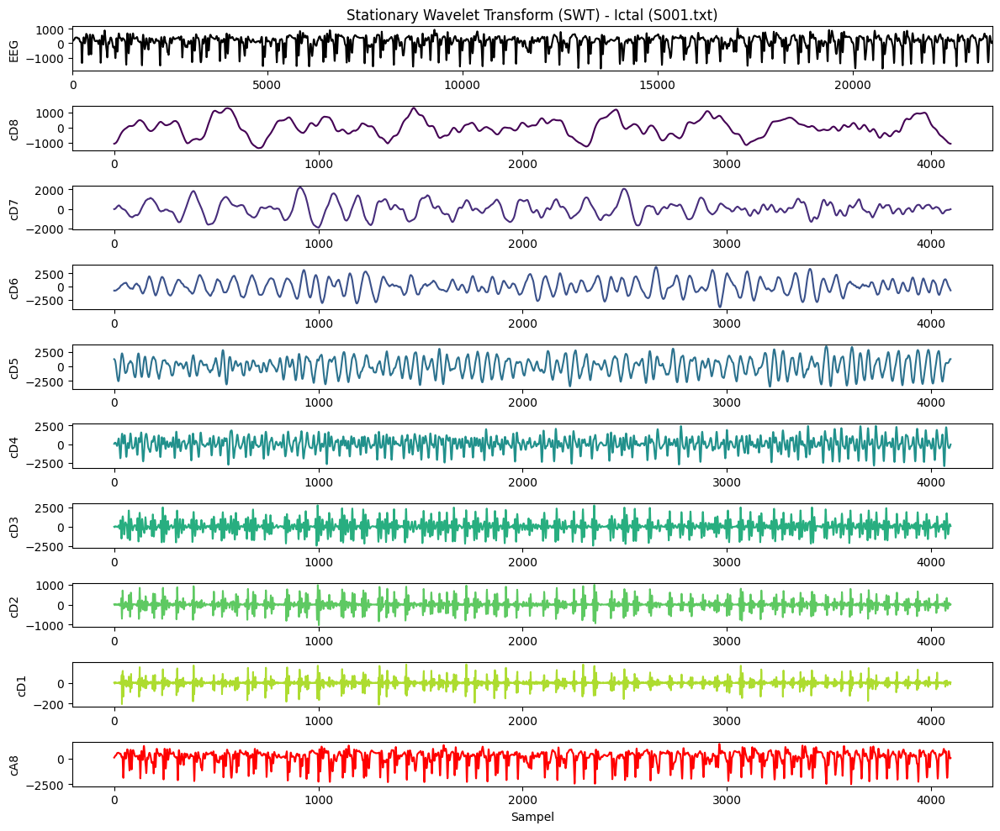

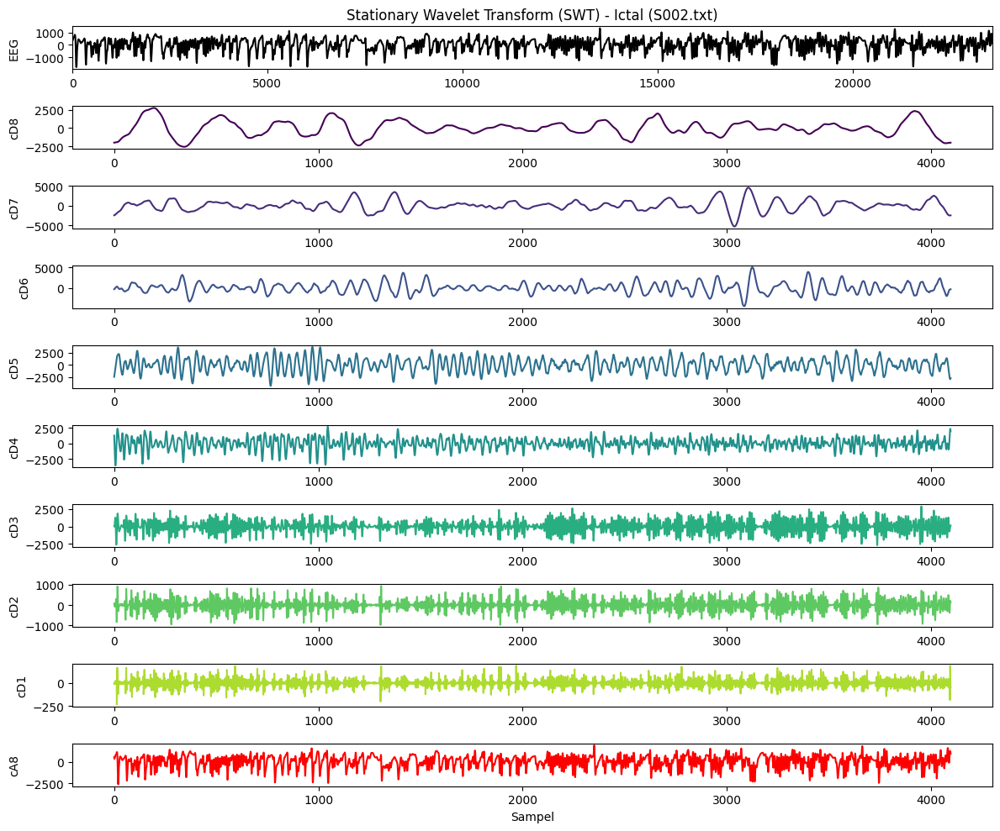

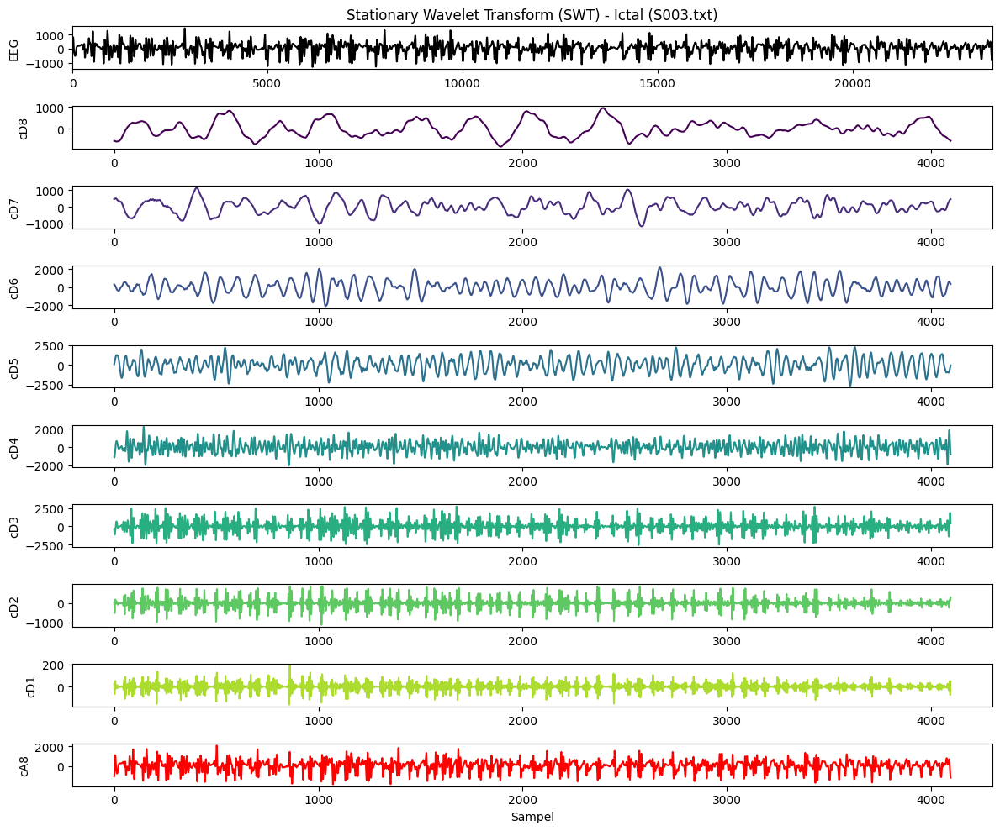

Fitur SWT berhasil diekstrak dan disimpan dalam SWT_EEG_Features.csv


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
from scipy.stats import skew, kurtosis

# **Parameter Dataset Bonn**
Fs = 173.6  # Sampling frequency (Hz)
samples_per_label = 3  # Ambil 3 sampel per label
wavelet = "db4"  # Wavelet yang digunakan
level = 8  # Level dekomposisi
signal_length = 4096  # Pastikan panjang sinyal 4096

# **DataFrame untuk menyimpan fitur**
columns = ["Label"]
for i in range(1, level + 1):
    columns += [f"Mean_cD{i}", f"Std_cD{i}", f"Skew_cD{i}", f"Kurt_cD{i}", f"RMS_cD{i}"]
columns.append("Mean_cA8")  # Approximation coefficient terakhir
df_features = pd.DataFrame(columns=columns)

# **Loop untuk tiap label**
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama per label

    for _, row in subset.iterrows():
        signal = row["Signal"][:signal_length]  # Ambil 4096 sampel
        filename = row["Filename"]

        # **Konversi waktu ke milidetik**
        time_ms = (np.arange(len(signal)) / Fs) * 1000

        # **Padding jika sinyal kurang dari 4096 sampel**
        if len(signal) < signal_length:
            pad_width = signal_length - len(signal)
            signal = np.pad(signal, (0, pad_width), mode="constant")

        # **Dekomposisi Wavelet hingga level 8 menggunakan SWT**
        coeffs = pywt.swt(signal, wavelet, level=level)
        cA = coeffs[-1][0]  # Approximation coefficient terakhir (level 8)
        detail_coeffs = [cD for _, cD in coeffs]  # Detail coefficients dari level 1 - 8

        # **Ekstraksi fitur statistik**
        features = [label]
        for cD in detail_coeffs:
            features += [
                np.mean(np.abs(cD)),  # Mean absolute
                np.std(cD),           # Standard deviation
                skew(cD),             # Skewness
                kurtosis(cD),         # Kurtosis
                np.sqrt(np.mean(cD**2))  # RMS
            ]
        features.append(np.mean(np.abs(cA)))  # Mean absolute dari Approximation coefficient

        # **Simpan fitur ke DataFrame**
        df_features.loc[len(df_features)] = features

        # **Visualisasi sinyal asli dan hasil SWT**
        plt.figure(figsize=(12, 10))

        plt.subplot(level + 2, 1, 1)
        plt.plot(time_ms, signal, label="Sinyal Asli", color="black")
        plt.ylabel("EEG")
        plt.title(f"Stationary Wavelet Transform (SWT) - {label} ({filename})")
        plt.xlim([0, max(time_ms)])

        for i, cD in enumerate(detail_coeffs):
            plt.subplot(level + 2, 1, i + 2)
            plt.plot(cD, label=f"cD{level-i}", color=plt.cm.viridis(i / level))
            plt.ylabel(f"cD{level-i}")

        plt.subplot(level + 2, 1, level + 2)
        plt.plot(cA, label="cA8 (Approximation)", color="red")
        plt.ylabel("cA8")
        plt.xlabel("Sampel")

        plt.tight_layout()
        plt.show()

# **Simpan fitur ke file CSV**
df_features.to_csv("SWT_EEG_Features.csv", index=False)
print("Fitur SWT berhasil diekstrak dan disimpan dalam SWT_EEG_Features.csv")


###  Dual Tree Complex Wavelet Transform

In [ ]:
!pip install dtcwt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 27.5 MB/s eta 0:00:00
  Created wheel for dtcwt: filename=dtcwt-0.14.0-py3-none-any.whl size=89102 sha256=44fccbf617ccd10d4d07b5c48677ec775eeb6f12dcc6df5d986e671de4b14dfd
  Stored in directory: /root/.cache/pip/wheels/9b/bb/8a/a308db74860f29b02ce5fd707d584a9cf36c583bada376909b
Successfully built dtcwt
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2


In [ ]:
!pip uninstall -y opencv-python-headless

Found existing installation: opencv-python-headless 4.11.0.86
Uninstalling opencv-python-headless-4.11.0.86:
  Successfully uninstalled opencv-python-headless-4.11.0.86


In [ ]:
import  dtcwt as dtcwt

print(dtcwt.numpy)


AttributeError: partially initialized module 'dtcwt' has no attribute 'numpy' (most likely due to a circular import)

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import dtcwt
from scipy.stats import skew, kurtosis

# **Parameter Dataset Bonn**
Fs = 173.6  # Sampling frequency (Hz)
samples_per_label = 3  # Ambil 3 sampel per label
wavelet = dtcwt.Transform1d()  # Transformasi Dual-Tree Complex Wavelet
level = 8  # Level dekomposisi
signal_length = 4096  # Pastikan panjang sinyal 4096

# **DataFrame untuk menyimpan fitur**
columns = ["Label"]
for i in range(1, level + 1):
    columns += [
        f"Mean_cD{i}_real", f"Std_cD{i}_real", f"Skew_cD{i}_real", f"Kurt_cD{i}_real", f"RMS_cD{i}_real",
        f"Mean_cD{i}_imag", f"Std_cD{i}_imag", f"Skew_cD{i}_imag", f"Kurt_cD{i}_imag", f"RMS_cD{i}_imag"
    ]
columns.append("Mean_cA8")  # Approximation coefficient terakhir
df_features = pd.DataFrame(columns=columns)

# **Loop untuk tiap label**
for label in df_data["Label"].unique():
    subset = df_data[df_data["Label"] == label].head(samples_per_label)  # Ambil 3 sampel pertama per label

    for _, row in subset.iterrows():
        signal = row["Signal"][:signal_length]  # Ambil 4096 sampel
        filename = row["Filename"]

        # **Konversi waktu ke milidetik**
        time_ms = (np.arange(len(signal)) / Fs) * 1000

        # **Padding jika sinyal kurang dari 4096 sampel**
        if len(signal) < signal_length:
            pad_width = signal_length - len(signal)
            signal = np.pad(signal, (0, pad_width), mode="constant")

        # **Dekomposisi menggunakan Dual-Tree Complex Wavelet Transform**
        transform = wavelet.forward(signal, nlevels=level)
        cA = transform.lowpass  # Approximation coefficient terakhir (level 8)
        detail_coeffs = transform.highpasses  # Detail coefficients dari level 1 - 8

        # **Ekstraksi fitur statistik**
        features = [label]
        for cD in detail_coeffs:
            cD_real = cD.real  # Bagian real
            cD_imag = cD.imag  # Bagian imaginer

            features += [
                np.mean(np.abs(cD_real)), np.std(cD_real), skew(cD_real), kurtosis(cD_real), np.sqrt(np.mean(cD_real**2)),
                np.mean(np.abs(cD_imag)), np.std(cD_imag), skew(cD_imag), kurtosis(cD_imag), np.sqrt(np.mean(cD_imag**2))
            ]
        features.append(np.mean(np.abs(cA)))  # Mean absolute dari Approximation coefficient

        # **Simpan fitur ke DataFrame**
        df_features.loc[len(df_features)] = features

        # **Visualisasi sinyal asli dan hasil DTCWT**
        plt.figure(figsize=(12, 10))

        plt.subplot(level + 2, 1, 1)
        plt.plot(time_ms, signal, label="Sinyal Asli", color="black")
        plt.ylabel("EEG")
        plt.title(f"Dual-Tree Complex Wavelet Transform (DTCWT) - {label} ({filename})")
        plt.xlim([0, max(time_ms)])

        for i, cD in enumerate(detail_coeffs):
            plt.subplot(level + 2, 1, i + 2)
            plt.plot(cD.real, label=f"cD{level-i}_real", color=plt.cm.viridis(i / level))
            plt.ylabel(f"cD{level-i} Real")

        plt.subplot(level + 2, 1, level + 2)
        plt.plot(cA, label="cA8 (Approximation)", color="red")
        plt.ylabel("cA8")
        plt.xlabel("Sampel")

        plt.tight_layout()
        plt.show()

# **Simpan fitur ke file CSV**
df_features.to_csv("DTCWT_EEG_Features.csv", index=False)
print("Fitur DTCWT berhasil diekstrak dan disimpan dalam DTCWT_EEG_Features.csv")


AttributeError: partially initialized module 'dtcwt' has no attribute 'numpy' (most likely due to a circular import)

In [ ]:
import wfdb
import numpy as np
import matplotlib.pyplot as plt
import dtcwt

# **Loop melalui beberapa file ECG**
for record_name in record_files:
    print(f"Memproses file: {record_name}")

    # **Muat sinyal ECG dari file MIT-BIH**
    record = wfdb.rdrecord(f"{data_path}/{record_name}")

    # Pilih channel pertama (ubah jika ingin channel lain)
    signal = record.p_signal[:, 0]

    # Pastikan panjang sinyal sesuai dengan syarat DTCWT (misalnya 1024, 2048, dst.)
    N = 2048  # Ubah jika perlu
    if len(signal) < N:
        print(f"Skipping {record_name}, sinyal terlalu pendek ({len(signal)} sampel)")
        continue
    signal = signal[:N]  # Potong sinyal jika lebih panjang dari N

    # **Lakukan DTCWT**
    transform = dtcwt.Transform1d()
    J = 4  # Level dekomposisi
    coeffs = transform.forward(signal, nlevels=J)

    # **Ambil koefisien dari level 1 hingga 4**
    def get_coefficients(coeffs, level):
        """Mengambil koefisien real dan imaginary dari level tertentu."""
        real_part = coeffs.highpasses[level].real
        imag_part = coeffs.highpasses[level].imag
        return real_part, imag_part

    w11, w12 = get_coefficients(coeffs, 0)
    w21, w22 = get_coefficients(coeffs, 1)
    w31, w32 = get_coefficients(coeffs, 2)
    w41, w42 = get_coefficients(coeffs, 3)

    # **Visualisasi hasil**
    fig, axs = plt.subplots(4, 2, figsize=(10, 8))

    axs[0, 0].plot(w11)
    axs[0, 0].set_ylabel("w11")
    axs[0, 0].set_title(f"{record_name} - Level 1")

    axs[0, 1].plot(w12)
    axs[0, 1].set_ylabel("w12")

    axs[1, 0].plot(w21)
    axs[1, 0].set_ylabel("w21")
    axs[1, 0].set_title(f"{record_name} - Level 2")

    axs[1, 1].plot(w22)
    axs[1, 1].set_ylabel("w22")

    axs[2, 0].plot(w31)
    axs[2, 0].set_ylabel("w31")
    axs[2, 0].set_title(f"{record_name} - Level 3")

    axs[2, 1].plot(w32)
    axs[2, 1].set_ylabel("w32")

    axs[3, 0].plot(w41)
    axs[3, 0].set_ylabel("w41")
    axs[3, 0].set_title(f"{record_name} - Level 4")

    axs[3, 1].plot(w42)
    axs[3, 1].set_ylabel("w42")

    plt.tight_layout()
    plt.show()

    # **Batasi jumlah file yang diproses**
    if record_files.index(record_name) >= 2:  # Tampilkan 3 file pertama
        break


## Analisis Wavelet Transform Tambahan

In [ ]:
import pywt

# loop untuk Wavelet Transform pada semua file
for record_name in record_files:
    print(f"Analisis Wavelet untuk {record_name}")

    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    signal = record.p_signal[:, 0]
    fs = record.fs
    time = np.arange(len(signal)) / fs

    # Continuous Wavelet Transform (CWT)
    coeffs, freqs = pywt.cwt(signal[:5000], scales=np.arange(1, 128), wavelet='morl', sampling_period=1/fs)

    # Visualisasi hasil Wavelet Transform
    plt.figure(figsize=(10, 5))
    plt.imshow(coeffs, aspect='auto', cmap='jet', extent=[time[0], time[5000], 1, 128])
    plt.colorbar(label="Magnitude")
    plt.ylabel("Skala Wavelet")
    plt.xlabel("Waktu (detik)")
    plt.title(f"Wavelet Transform untuk {record_name}")
    plt.show()


In [ ]:
import os
import numpy as np
import wfdb
import matplotlib.pyplot as plt
import pywt
from scipy.fft import fft, fftfreq
from google.colab import drive

for record_name in record_files:
    print(f"Membaca file: {record_name}")

    # Membaca rekaman dan anotasi
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    annotation = wfdb.rdann(os.path.join(data_path, record_name), "atr")

    # Ambil data sinyal pertama
    signal = record.p_signal[:, 0]
    fs = record.fs
    time_ms = (np.arange(len(signal)) / fs) * 1000  # Konversi ke milidetik

    # Filter hanya rentang 0 - 5000 ms**
    mask = (time_ms >= 0) & (time_ms <= 5000)
    time_ms = time_ms[mask]
    signal = signal[mask]

    # **Visualisasi Sinyal Waktu**
    plt.figure(figsize=(15, 5))
    plt.plot(time_ms, signal, label=f"Rekaman: {record_name}", linewidth=1.5)
    plt.xlabel("Waktu (ms)", fontsize=14)
    plt.ylabel("Amplitudo", fontsize=14)
    plt.title(f"Sinyal ECG/ECG dari {record_name}", fontsize=16, fontweight="bold")
    plt.xticks(np.arange(0, 5200, 200))  # Interval 200 ms
    plt.legend(fontsize=12)
    plt.grid(linestyle="--", alpha=0.7)
    plt.show()


    # **Wavelet Transform (CWT) dengan Morlet Wavelet**
    scales = np.arange(1, 128)  # Skala wavelet
    coeffs, freqs = pywt.cwt(signal[:5000], scales=scales, wavelet='morl', sampling_period=1/fs)

    # **Visualisasi Wavelet Transform**
    plt.figure(figsize=(15, 6))
    plt.imshow(np.abs(coeffs), aspect='auto', cmap='jet', extent=[0, 5000, 1, 128])
    plt.colorbar(label="Kekuatan Koefisien Wavelet")
    plt.xlabel("Waktu (ms)", fontsize=14)
    plt.ylabel("Skala Wavelet", fontsize=14)
    plt.title(f"Wavelet Transform dari {record_name} (Morlet)", fontsize=16, fontweight="bold")
    plt.show()

    # **Batasi jumlah file yang divisualisasikan**
    if record_files.index(record_name) >= 2:  # tampilkan 3 file pertama
        break


### Analisis perbandinagan berbagai jenis Wavelet Transform

Kode di bawah ini menganalisis sinyal ECG/ECG dari MIT-BIH Arrhythmia Dataset menggunakan Continuous Wavelet Transform (CWT) dengan wavelet: Morlet (morl), Complex Morlet (cmor), Mexican Hat (mexh), Gaussian (gaus1), dan Shannon (shan). Visualisasi dilakukan dalam rentang 0 - 5000 ms.


| **Wavelet**   | **Karakteristik** | **Kegunaan** |
|--------------|----------------|------------|
| **Morlet (`morl`)** | Kombinasi sinusoidal dan Gaussian | Analisis spektrum waktu-frekuensi |
| **Complex Morlet (`cmor`)** | Versi kompleks dari Morlet | Resolusi lebih tajam dalam domain frekuensi |
| **Mexican Hat (`mexh`)** | Turunan kedua dari Gaussian | Deteksi fitur atau puncak dalam sinyal |
| **Gaussian (`gaus1`)** | Bentuk Gaussian pertama | Mendeteksi perubahan cepat dalam sinyal |
| **Shannon (`shan`)** | Diskontinu dengan properti seperti filter ideal | Analisis frekuensi dengan resolusi tajam |

- **Morlet (`morl`)** paling umum digunakan untuk analisis spektrum waktu-frekuensi.  
- **Complex Morlet (`cmor`)** memberikan resolusi lebih baik dalam domain frekuensi.  
- **Mexican Hat (`mexh`)** cocok untuk deteksi perubahan cepat pada sinyal.  
- **Gaussian (`gaus1`)** berguna untuk mendeteksi transisi tajam dalam sinyal ECG/ECG.  
- **Shannon (`shan`)** memberikan resolusi frekuensi tinggi tetapi kurang presisi dalam waktu.  


In [ ]:
import os
import numpy as np
import wfdb
import matplotlib.pyplot as plt
import pywt
from google.colab import drive


wavelets = ["morl", "cmor", "mexh", "gaus1", "shan"]

for record_name in record_files[:4]:
    print(f"Membaca file: {record_name}")

    # Membaca rekaman
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    signal = record.p_signal[:, 0]
    fs = record.fs
    time_ms = (np.arange(len(signal)) / fs) * 1000  # Konversi ke milidetik

    # **Filter hanya rentang 0 - 5000 ms**
    mask = (time_ms >= 0) & (time_ms <= 5000)
    time_ms = time_ms[mask]
    signal = signal[mask]

    # **Visualisasi Sinyal Asli**
    plt.figure(figsize=(15, 4))
    plt.plot(time_ms, signal, label=f"Rekaman: {record_name}", linewidth=1.5)
    plt.xlabel("Waktu (ms)", fontsize=14)
    plt.ylabel("Amplitudo", fontsize=14)
    plt.title(f"Sinyal ECG/ECG dari {record_name}", fontsize=16, fontweight="bold")
    plt.xticks(np.arange(0, 5200, 200))  # Interval 200 ms
    plt.legend(fontsize=12)
    plt.grid(linestyle="--", alpha=0.7)
    plt.show()

    # **Wavelet Transform dengan berbagai wavelet**
    scales = np.arange(1, 128)  # Skala wavelet
    fig, axes = plt.subplots(len(wavelets), 1, figsize=(15, 3 * len(wavelets)))

    for i, wavelet in enumerate(wavelets):
        coeffs, freqs = pywt.cwt(signal[:5000], scales=scales, wavelet=wavelet, sampling_period=1/fs)

        im = axes[i].imshow(np.abs(coeffs), aspect='auto', cmap='jet', extent=[0, 5000, 1, 128])
        axes[i].set_title(f"CWT dengan {wavelet}", fontsize=14, fontweight="bold")
        axes[i].set_ylabel("Skala Wavelet", fontsize=12)
        axes[i].grid(linestyle="--", alpha=0.5)

        # **Tambahkan colorbar untuk setiap plot**
        cbar = fig.colorbar(im, ax=axes[i], orientation="vertical")
        cbar.set_label("Intensitas Koefisien", fontsize=12)

    axes[-1].set_xlabel("Waktu (ms)", fontsize=12)
    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import emd
from scipy.signal import hilbert

# Loop untuk setiap file ECG
for record_name in record_files[:3]:  # Proses 3 file pertama sebagai contoh
    print(f"Memproses file: {record_name}")

    # Baca rekaman
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    signal = record.p_signal[:, 0]
    fs = record.fs
    time_ms = (np.arange(len(signal)) / fs) * 1000  # Konversi ke milidetik

    # **Batasan waktu: hanya tampilkan dari 0 hingga 5000 ms**
    mask = (time_ms >= 0) & (time_ms <= 5000)
    time_ms = time_ms[mask]
    signal = signal[mask]

    # **STFT (Spectrogram)**
    frequencies, times, Sxx = spectrogram(signal, fs, nperseg=256)

    # **Visualisasi Spectrogram (STFT)**
    plt.figure(figsize=(12, 6))
    plt.pcolormesh(times * 1000, frequencies, 10 * np.log10(Sxx), shading='gouraud', cmap='jet')
    plt.colorbar(label="Power (dB)")
    plt.title(f"{record_name} - Spectrogram (STFT)", fontsize=16, fontweight='bold')
    plt.xlabel("Time (ms)", fontsize=14)
    plt.ylabel("Frequency (Hz)", fontsize=14)
    plt.ylim([0, 100])  # Batas frekuensi hingga 100 Hz
    plt.grid(alpha=0.5, linestyle="--")
    plt.show()


## Analisis Lanjutan, Proses Denoised dan Penggunaan Z-score

##

In [ ]:
import os
import numpy as np
import wfdb
import matplotlib.pyplot as plt
from scipy.signal import butter, cheby1, bessel, filtfilt, medfilt
from scipy.stats import zscore
from google.colab import drive


#  Fungsi untuk berbagai filter
def butter_lowpass_filter(signal, cutoff=50, fs=360, order=4):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, signal)

def cheby1_lowpass_filter(signal, cutoff=50, fs=360, order=4, rp=0.5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = cheby1(order, rp, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, signal)

def bessel_lowpass_filter(signal, cutoff=50, fs=360, order=4):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = bessel(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, signal)

def median_filter(signal, kernel_size=5):
    return medfilt(signal, kernel_size=kernel_size)

# 5. Loop untuk membaca, menerapkan filter, dan memvisualisasikan
for record_name in record_files[:3]:  # Proses 3 file pertama
    print(f"Memproses file: {record_name}")

    # Baca rekaman
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    signal = record.p_signal[:, 0]
    fs = record.fs
    time_ms = (np.arange(len(signal)) / fs) * 1000  # Konversi ke milidetik

    # **Batasan waktu: hanya tampilkan dari 0 hingga 5000 ms**
    mask = (time_ms >= 0) & (time_ms <= 5000)
    time_ms = time_ms[mask]
    signal = signal[mask]

    # **Denoised dengan berbagai filter**
    butter_filtered = butter_lowpass_filter(signal, cutoff=50, fs=fs, order=4)
    cheby1_filtered = cheby1_lowpass_filter(signal, cutoff=50, fs=fs, order=4)
    bessel_filtered = bessel_lowpass_filter(signal, cutoff=50, fs=fs, order=4)
    median_filtered = median_filter(signal, kernel_size=5)

    # **Z-score Normalization**
    signal_zscore = zscore(signal)
    butter_zscore = zscore(butter_filtered)
    cheby1_zscore = zscore(cheby1_filtered)
    bessel_zscore = zscore(bessel_filtered)
    median_zscore = zscore(median_filtered)

    # **Visualisasi Gabungan**
    plt.figure(figsize=(20, 18))  # Ukuran lebih besar

    xticks = np.arange(0, 5500, 500)  # Konfigurasi sumbu X dalam interval 500 ms

    # Plot 1: Original Signal
    plt.subplot(4, 1, 1)
    plt.plot(time_ms, signal, label="Original Signal", color='black', linewidth=1.5)
    plt.title(f"{record_name} - Original Signal", fontsize=18, fontweight='bold')
    plt.xlabel("Time (ms)", fontsize=16)
    plt.ylabel("Amplitude", fontsize=16)
    plt.xticks(xticks)
    plt.legend(fontsize=14)
    plt.grid(linestyle="--", alpha=0.7)

    # Plot 2: Denoised (Filtered)
    plt.subplot(4, 1, 2)
    plt.plot(time_ms, butter_filtered, label="Butterworth", color='blue', linewidth=1)
    plt.plot(time_ms, cheby1_filtered, label="Chebyshev", color='green', linewidth=1)
    plt.plot(time_ms, bessel_filtered, label="Bessel", color='red', linewidth=1)
    plt.plot(time_ms, median_filtered, label="Median", color='purple', linewidth=1)
    plt.title(f"{record_name} - Denoised (Filtered)", fontsize=18, fontweight='bold')
    plt.xlabel("Time (ms)", fontsize=16)
    plt.ylabel("Amplitude", fontsize=16)
    plt.xticks(xticks)
    plt.legend(fontsize=14)
    plt.grid(linestyle="--", alpha=0.7)

    # Plot 3: Z-score Normalization (Tanpa Filter)
    plt.subplot(4, 1, 3)
    plt.plot(time_ms, signal_zscore, label="Z-score Only", color='orange', linewidth=1.5)
    plt.title(f"{record_name} - Z-score Normalized (No Filter)", fontsize=18, fontweight='bold')
    plt.xlabel("Time (ms)", fontsize=16)
    plt.ylabel("Z-score", fontsize=16)
    plt.xticks(xticks)
    plt.legend(fontsize=14)
    plt.grid(linestyle="--", alpha=0.7)

    # Plot 4: Denoised + Z-score
    plt.subplot(4, 1, 4)
    plt.plot(time_ms, butter_zscore, label="Butterworth", color='blue', linewidth=1)
    plt.plot(time_ms, cheby1_zscore, label="Chebyshev", color='green', linewidth=1)
    plt.plot(time_ms, bessel_zscore, label="Bessel", color='red', linewidth=1)
    plt.plot(time_ms, median_zscore, label="Median", color='purple', linewidth=1)
    plt.title(f"{record_name} - Denoised + Z-score Normalized", fontsize=18, fontweight='bold')
    plt.xlabel("Time (ms)", fontsize=16)
    plt.ylabel("Z-score", fontsize=16)
    plt.xticks(xticks)
    plt.legend(fontsize=14)
    plt.grid(linestyle="--", alpha=0.7)

    plt.tight_layout()
    plt.show()

    # **Visualisasi Individual untuk Setiap Filter**
    filters = {
        "Butterworth": butter_filtered,
        "Chebyshev Type I": cheby1_filtered,
        "Bessel": bessel_filtered,
        "Median": median_filtered
    }

    for filter_name, filtered_signal in filters.items():
        plt.figure(figsize=(12, 5))
        plt.plot(time_ms, filtered_signal, label=f"{filter_name} Filter", linewidth=1.5)
        plt.title(f"{record_name} - {filter_name} Filter", fontsize=16, fontweight='bold')
        plt.xlabel("Time (ms)", fontsize=14)
        plt.ylabel("Amplitude", fontsize=14)
        plt.xticks(xticks)
        plt.legend(fontsize=12)
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()

    # **Visualisasi Individual untuk Filter + Z-score**
    for filter_name, filtered_signal in {
        "Butterworth + Z-score": butter_zscore,
        "Chebyshev + Z-score": cheby1_zscore,
        "Bessel + Z-score": bessel_zscore,
        "Median + Z-score": median_zscore
    }.items():
        plt.figure(figsize=(12, 5))
        plt.plot(time_ms, filtered_signal, label=filter_name, linewidth=1.5)
        plt.title(f"{record_name} - {filter_name}", fontsize=16, fontweight='bold')
        plt.xlabel("Time (ms)", fontsize=14)
        plt.ylabel("Z-score", fontsize=14)
        plt.xticks(xticks)
        plt.legend(fontsize=12)
        plt.grid(linestyle="--", alpha=0.7)
        plt.show()
